In [ ]:
import tensorflow as tf
print(tf.__version__)

2.12.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
root_dir = "/content/drive/My Drive/Tesis/Desarrollo/"
print(root_dir)

Mounted at /content/drive
/content/drive/My Drive/Tesis/Desarrollo/


In [ ]:
base_dir = root_dir + 'ColeccionGrande/'
print(base_dir)

/content/drive/My Drive/Tesis/Desarrollo/ColeccionGrande/


In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

In [ ]:
img = np.array(hf.get('S_train')[0])

In [ ]:
img.shape

(256, 256, 4)

## **Importar datasets ya construídos:**

In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

S_train = np.array(hf.get('S_train')[7500:10000])
print('S_train cargado.')
S_test = np.array(hf.get('S_test')[1875:2500])
print('S_test cargado.')
P_train = np.array(hf.get('P_train')[7500:10000])
print('P_train cargado.')
P_test = np.array(hf.get('P_test')[1875:2500])
print('P_test cargado.')

print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

S_train cargado.
S_test cargado.
P_train cargado.
P_test cargado.
(2500, 256, 256, 4) (625, 256, 256, 4) (2500, 256, 256) (625, 256, 256)


In [ ]:
P_train = P_train.reshape((-1, 256, 256, 1))
P_test = P_test.reshape((-1, 256, 256, 1))

In [ ]:
print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

(2500, 256, 256, 4) (625, 256, 256, 4) (2500, 256, 256, 1) (625, 256, 256, 1)


## **Construcción de la red neuronal tipo UNET**

**Una vez se tienen las entradas(S) y salidas(P) definidas, se realiza el diseño de una arquitectura de red neuronal por medio de Tensorflow:**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import concatenate
from keras.layers import UpSampling2D
from keras.layers import Input, Dropout
from tensorflow.keras import Model

In [ ]:
from keras.layers import Activation, BatchNormalization, Conv2D, UpSampling2D, Conv2DTranspose, concatenate
from keras.layers import MaxPooling2D, Dropout, Input, AveragePooling2D, Reshape, Permute, UpSampling2D
from keras.layers import SimpleRNN, Bidirectional, LSTM
from keras.layers import Lambda
from keras.models import load_model, Model
from keras.losses import sparse_categorical_crossentropy
import tensorflow as tf

from keras.optimizers import *
import keras.backend as K
import keras
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
def get_photoelasnet():
    ## input to the network
    input = Input((256, 256, 4))

    ## encoder network
    c1 = Conv2D(filters=4, kernel_size=(3,3), padding='same')(input)
    c1 = BatchNormalization()(c1)
    c1 = Activation('selu')(c1)
    c2 = Conv2D(filters=4, kernel_size=(3,3), padding='same')(c1)
    c2 = BatchNormalization()(c2)
    c2 = Activation('selu')(c2)
    c3 = Conv2D(filters=4, kernel_size=(3,3), padding='same')(c2)
    c3 = BatchNormalization()(c3)
    c3 = Activation('selu')(c3)
    c4 = Conv2D(filters=4, kernel_size=(3,3), padding='same')(c3)
    c4 = BatchNormalization()(c4)
    c4 = Activation('selu')(c4)
    p1 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(filters=8, kernel_size=(3,3), padding='same')(p1)
    c5 = BatchNormalization()(c5)
    c5 = Activation('selu')(c5)
    c6 = Conv2D(filters=8, kernel_size=(3,3), padding='same')(c5)
    c6 = BatchNormalization()(c6)
    c6 = Activation('selu')(c6)
    p2 = MaxPooling2D(pool_size=(2, 2))(c6)

    c7 = Conv2D(filters=64, kernel_size=(3,3), padding='same')(p2)
    c7 = BatchNormalization()(c7)
    c7 = Activation('selu')(c7)
    c8 = Conv2D(filters=64, kernel_size=(3,3), padding='same')(c7)
    c8 = BatchNormalization()(c8)
    c8 = Activation('selu')(c8)
    p3 = MaxPooling2D(pool_size=(2, 2))(c8)

    # decoder Network
    c9 = Conv2D(256, kernel_size=(3,3), padding='same')(p3)
    c9 = BatchNormalization()(c9)
    c9 = Activation('selu')(c9)
    c10 = Conv2D(256, kernel_size=(3,3), padding='same')(c9)
    c10 = BatchNormalization()(c10)
    c10 = Activation('selu')(c10)
    u1 = UpSampling2D(size=(2, 2))(c10)

    c11 = Conv2D(64, kernel_size=(3,3), padding='same')(u1)
    c11 = BatchNormalization()(c11)
    c11 = Activation('selu')(c11)
    c12 = Conv2D(64, kernel_size=(3,3), padding='same')(c11)
    c12 = BatchNormalization()(c12)
    c12 = Activation('selu')(c12)
    u2 = UpSampling2D(size=(2, 2))(c12)

    c13 = Conv2D(8, kernel_size=(3,3), padding='same')(u2)
    c13 = BatchNormalization()(c13)
    c13 = Activation('selu')(c13)
    c14 = Conv2D(8, kernel_size=(3,3), padding='same')(c13)
    c14 = BatchNormalization()(c14)
    c14 = Activation('selu')(c14)
    u3 = UpSampling2D(size=(2, 2))(c14)

    ## output layer
    c15 = Conv2D(4, kernel_size=(3,3), padding='same')(u3)
    c15 = BatchNormalization()(c15)
    c15 = Activation('selu')(c15)
    c16 = Conv2D(4, kernel_size=(3,3), padding='same')(c15)
    c16 = BatchNormalization()(c16)
    c16 = Activation('selu')(c16)
    c17 = Conv2D(4, kernel_size=(3,3), padding='same')(c16)
    c17 = BatchNormalization()(c17)
    c17 = Activation('selu')(c17)
    c18 = Conv2D(4, kernel_size=(3,3), padding='same')(c17)
    c18 = BatchNormalization()(c18)
    c18 = Activation('selu')(c18)
    output = Conv2D(1, kernel_size=(3, 3), padding='same', name='out1')(c18)
    output = Activation('linear')(output)

    model = Model(inputs=[input], outputs=[output])
    return model

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
model = get_photoelasnet()

model_id = 'PhotoelasNet4_100e_4b_256_7500'
model_path = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/{}.h5'.format(model_id)

earlystopper = EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True
)

In [ ]:
model = tf.keras.models.load_model('/content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/PhotoelasNet4_100e_4b_256_10000.h5')

In [ ]:
loss = "mean_squared_error"

model.compile(optimizer="Adam", loss = loss)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 4)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 4)       148       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 4)      16        
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 256, 256, 4)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 4)       148       
                                                                 
 batch_normalization_1 (Batc  (None, 256, 256, 4)      16        
 hNormalization)                                             

In [ ]:
history = model.fit(S_train, P_train, validation_data=(S_test, P_test), epochs=100, batch_size=4, callbacks=[model_checkpoint, earlystopper])

Epoch 1/100
625/625 [==============================] - ETA: 0s - loss: 8.0803e-04
Epoch 1: val_loss improved from inf to 0.00320, saving model to /content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/PhotoelasNet4_100e_4b_256_7500.h5
625/625 [==============================] - 36s 40ms/step - loss: 8.0803e-04 - val_loss: 0.0032
Epoch 2/100
625/625 [==============================] - ETA: 0s - loss: 7.9079e-04
Epoch 2: val_loss improved from 0.00320 to 0.00142, saving model to /content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/PhotoelasNet4_100e_4b_256_7500.h5
625/625 [==============================] - 23s 38ms/step - loss: 7.9079e-04 - val_loss: 0.0014
Epoch 3/100
624/625 [============================>.] - ETA: 0s - loss: 7.8179e-04
Epoch 3: val_loss improved from 0.00142 to 0.00111, saving model to /content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/PhotoelasNet4_100e_4b_256_7500.h5
625/625 [==============================] - 24s 38ms/step - loss: 7.8102e-04 

## **Funciones para mostrar resultados**

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def loss_plot(history):
  loss = history.history['loss']
  epochs = np.arange(0, len(loss), 1)
  plt.plot(epochs, loss)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title("Epochs vs. Loss")
  plt.yscale("log")
  plt.grid()
  plt.show

In [ ]:
def overf_plot(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Loss vs. epochs')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.yscale("log")
  plt.legend(['Training', 'Validation'], loc='upper right')
  plt.show()

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
def plot(*argv, titles=None):
  """
  plots a given number of phase maps
  """
  if len(argv) == 1:
    f, ax = plt.subplots(1, 1, sharey=True, figsize=(5, 5))
    if titles is not None:
      ax.set_title(titles)
    a = ax.imshow(argv[0].squeeze(), cmap='gray')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    f.colorbar(a, cax=cax)
    plt.show()
  else:
    f, axes = plt.subplots(1, len(argv), sharey=True, figsize=(10, 10))
    for i in range(len(argv)):
        if titles is not None:
          axes[i].set_title(titles[i])
        a = axes[i].imshow(argv[i].squeeze(), cmap='gray')
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        f.colorbar(a, cax=cax)
    plt.show()
    f.colorbar(a, cax=cax)

In [ ]:
def plot_hist(*argv, titles):
  """
  plots the historgram of the input phase maps
  """
  for i in range(len(argv)):
      hist = np.histogram(argv[i].ravel(), bins=100)
      plt.plot(hist[1][1:], hist[0])
  plt.xlabel("phase values")
  plt.ylabel("frequency")
  plt.title("Histogram Analysis")
  plt.grid()
  if titles is not None:
    plt.legend(titles)
  plt.show()

In [ ]:
def read_model(model, url, bs):
  model = model
  model.compile(optimizer="adam", loss = 'mean_squared_error')

  model_path = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/PhotoelasNet/' + url
  model.load_weights(model_path)
  return model


In [ ]:
def show_results(model, url, bs):
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)
  idx = np.random.randint(0, S_test.shape[0])
  print(idx)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(S_test[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(P_test[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

In [ ]:
min = h5py.File(base_dir + 'DatasetsMin.hdf5', 'r')
max = h5py.File(base_dir + 'DatasetsMax.hdf5', 'r')

min_in = np.array(min.get('S_train'))
min_out = np.array(min.get('P_train'))
print('DatasetMin cargado.')

max_in = np.array(max.get('S_train'))
max_out = np.array(max.get('P_train'))
print('DatasetMax cargado.')

print(min_in.shape, min_out.shape, max_in.shape, max_out.shape)

def show_results_min(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(min_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(min_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(min_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

def show_results_max(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(max_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(max_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(max_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

DatasetMin cargado.
DatasetMax cargado.
(504, 256, 256, 4) (504, 256, 256) (504, 256, 256, 4) (504, 256, 256)


## **Resultados de los modelos generados**

126/126 [==============================] - 11s 9ms/step


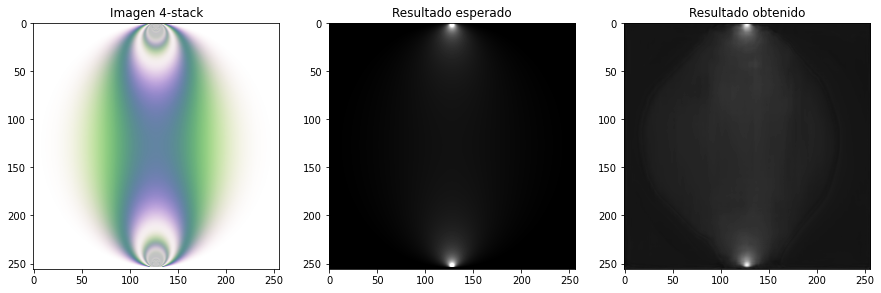

In [ ]:
show_results_max(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4, 0)

126/126 [==============================] - 2s 10ms/step


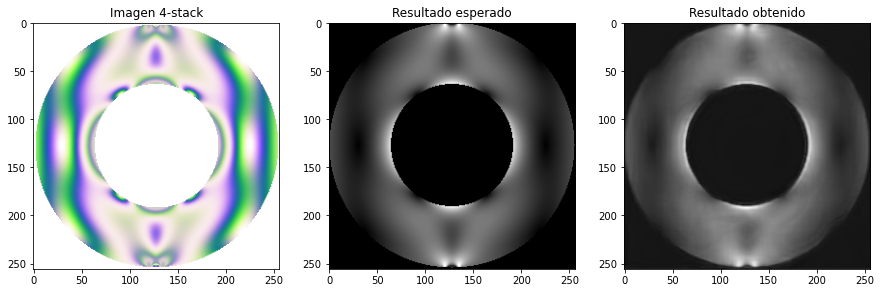

In [ ]:
show_results_max(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4, 100)

126/126 [==============================] - 2s 10ms/step


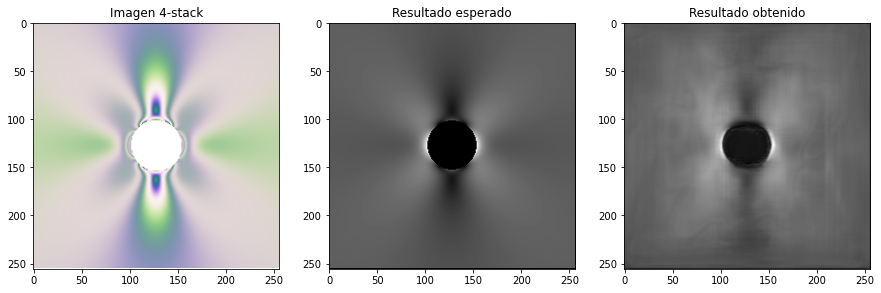

In [ ]:
show_results_max(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4, 200)

126/126 [==============================] - 2s 10ms/step


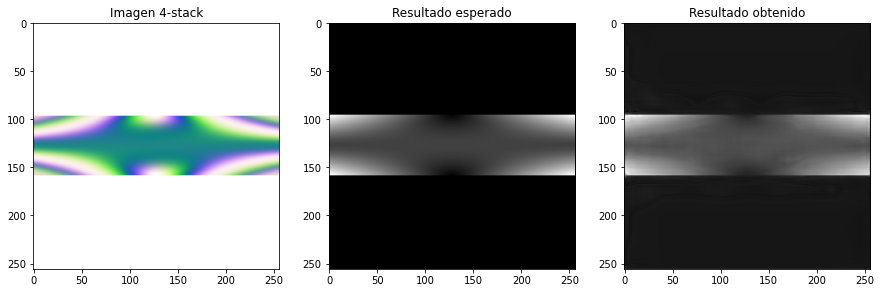

In [ ]:
show_results_max(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4, 300)

**Model8_100e_4b_256_2500**

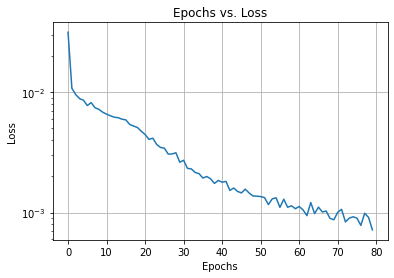

In [ ]:
loss_plot(history)

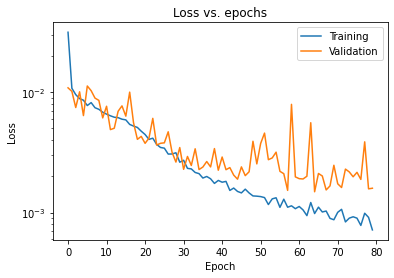

In [ ]:
overf_plot(history)

163/163 [==============================] - 10s 12ms/step
498


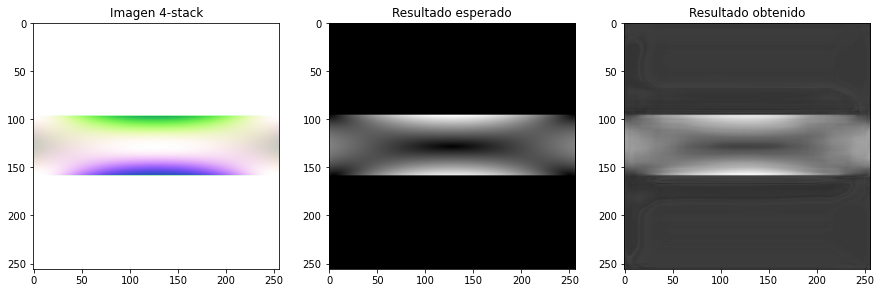

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_2500.h5', 4)

163/163 [==============================] - 2s 11ms/step
491


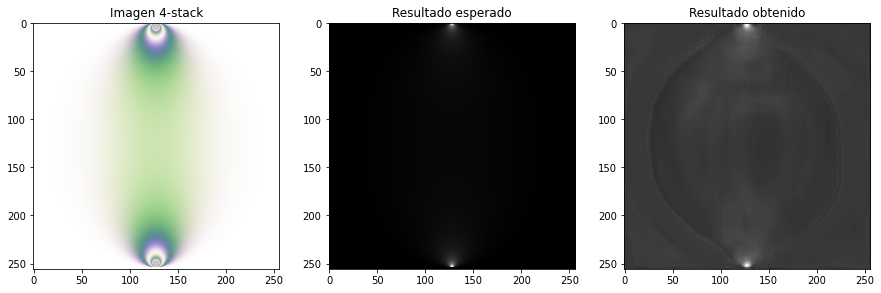

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_2500.h5', 4)

163/163 [==============================] - 2s 10ms/step
53


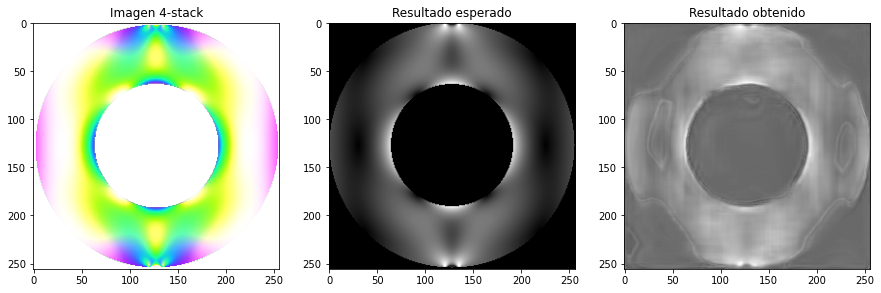

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_2500.h5', 4)

163/163 [==============================] - 3s 16ms/step
572


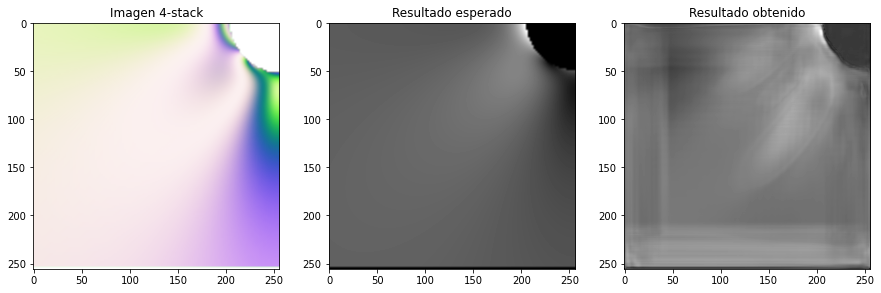

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_2500.h5', 4)

---

**Model8_100e_4b_256_5000**

157


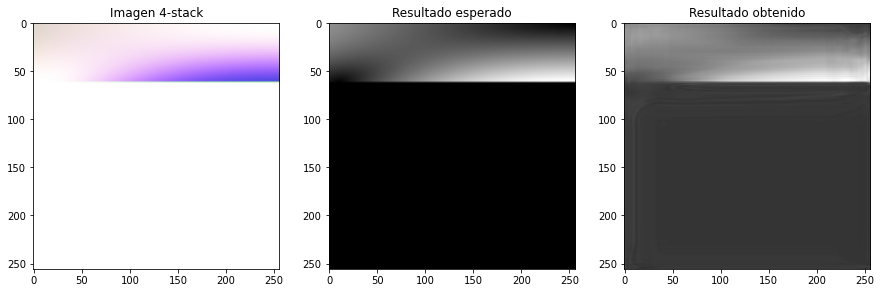

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

440


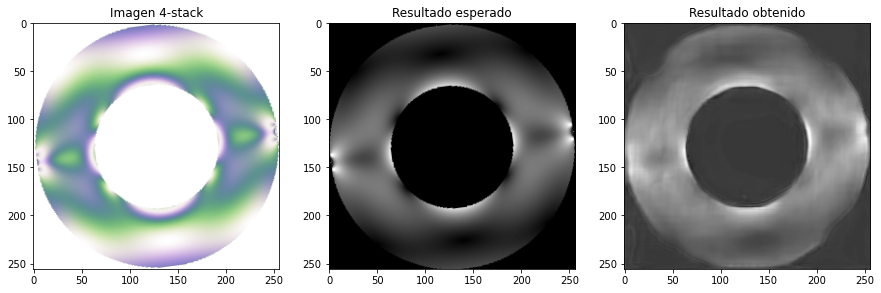

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

5


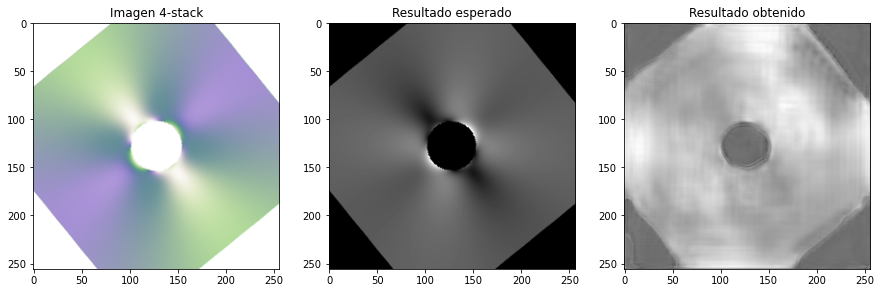

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

411


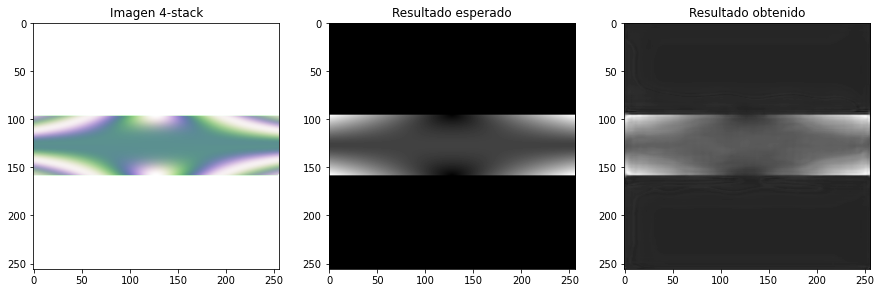

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

109


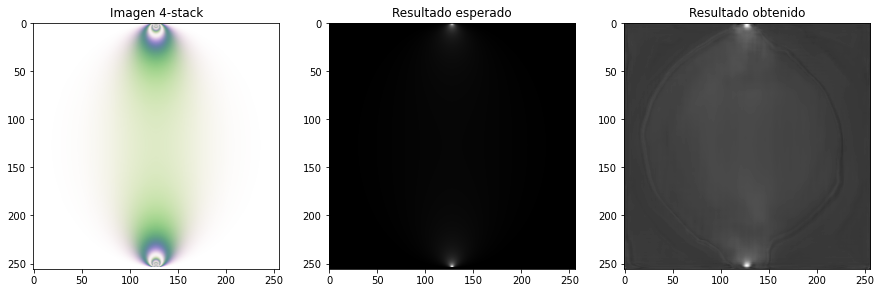

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

---

**Model8_100e_4b_256_7500**

157/157 [==============================] - 10s 12ms/step
317


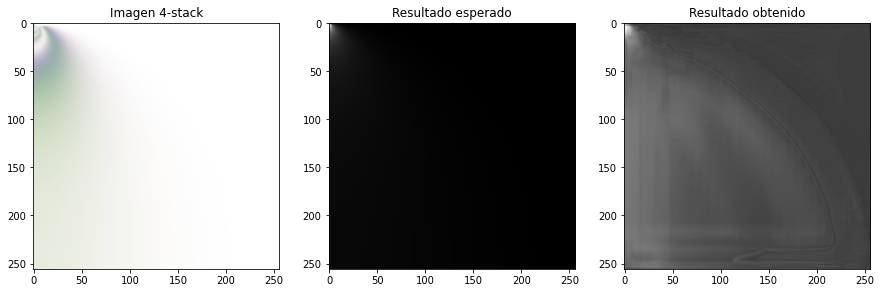

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 2s 11ms/step
416


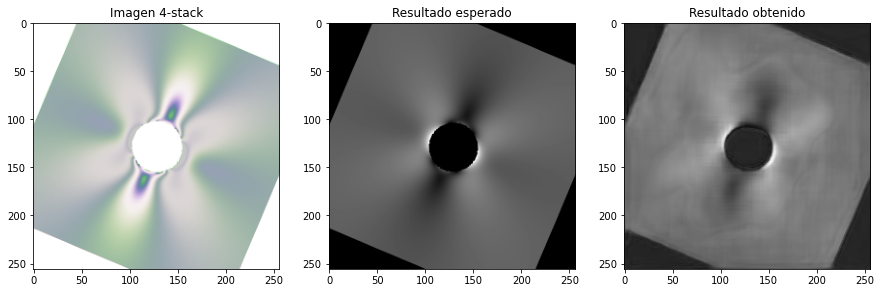

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 2s 10ms/step
14


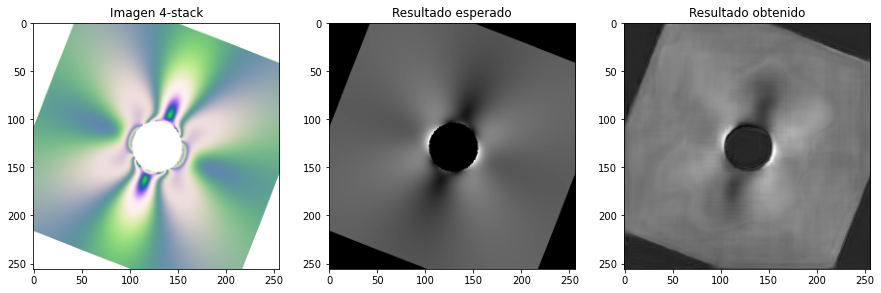

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 2s 10ms/step
214


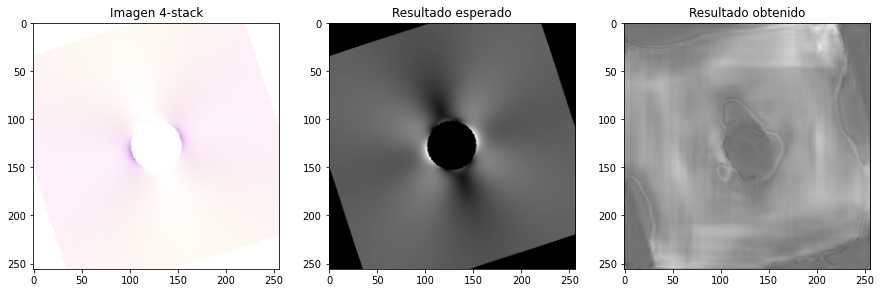

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 2s 10ms/step
56


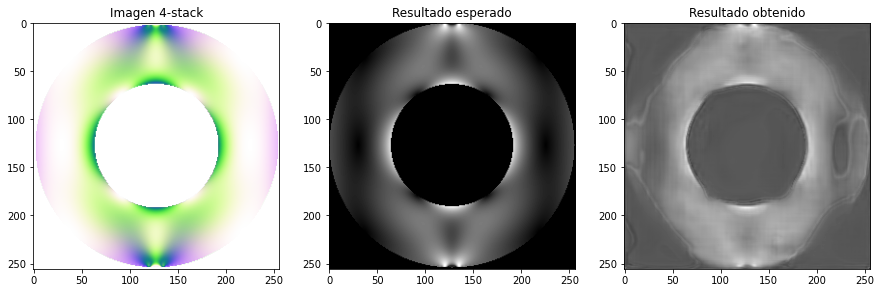

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

**Model8_100e_4b_256_10000**

262


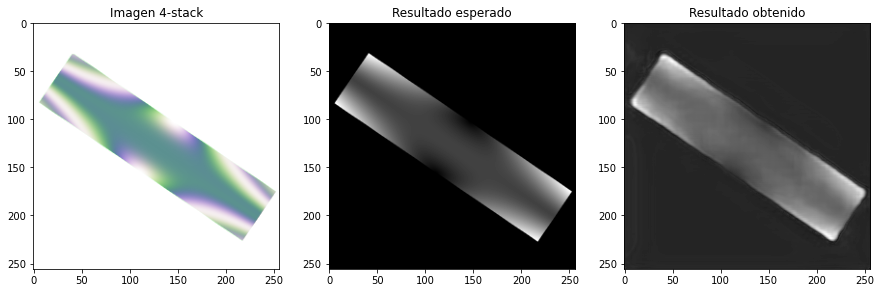

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

572


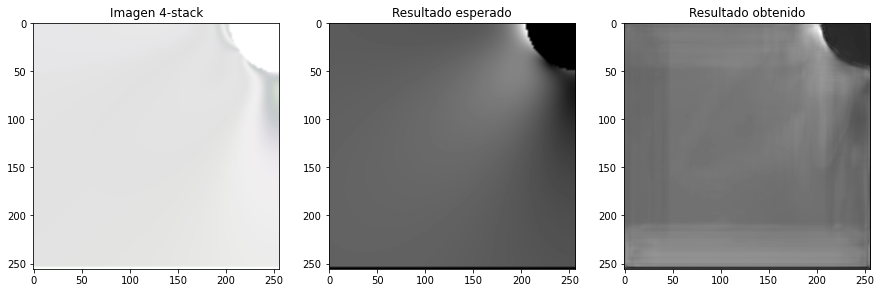

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

36


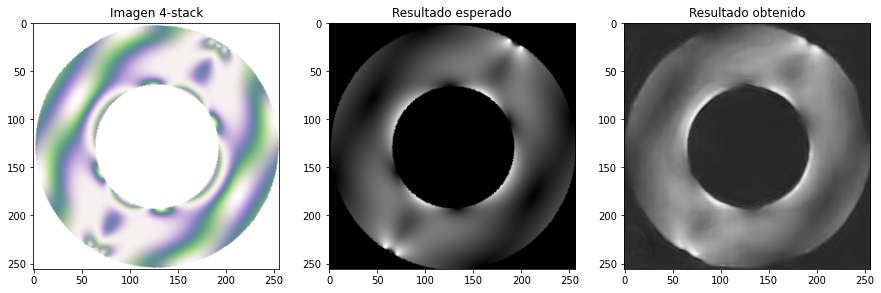

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

79


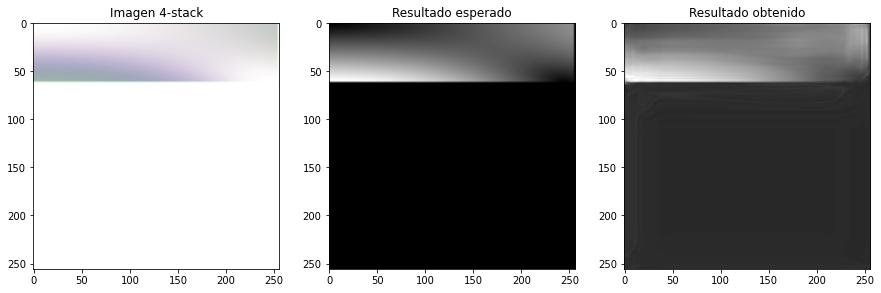

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

484


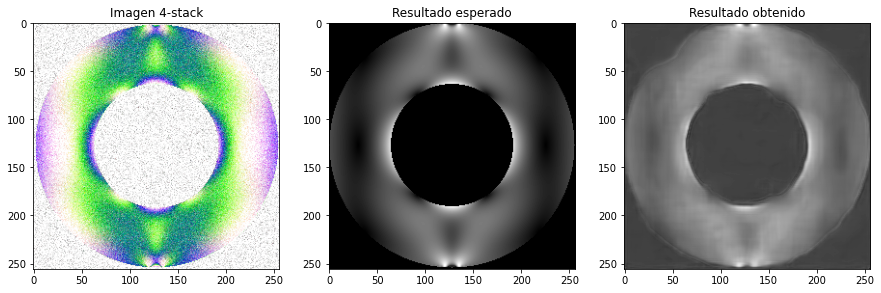

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

**Model8_100e_4b_256_12500**

69


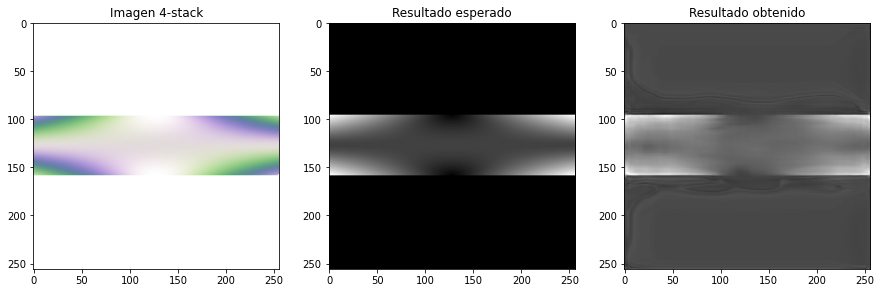

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

195


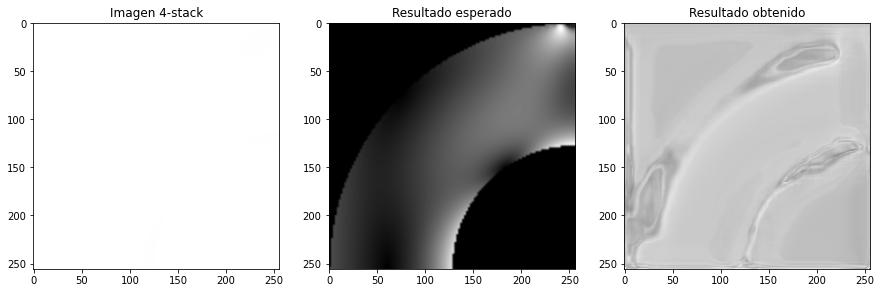

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

504


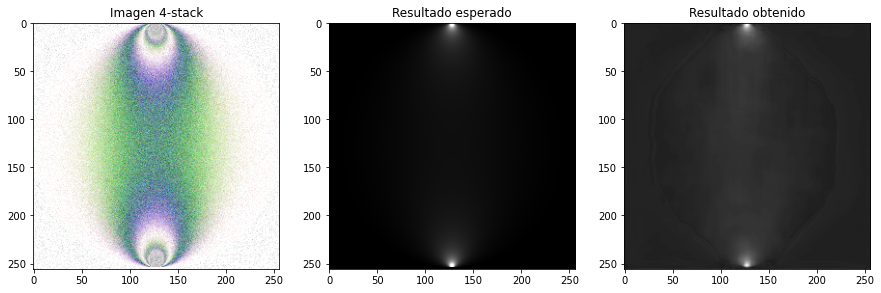

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

174


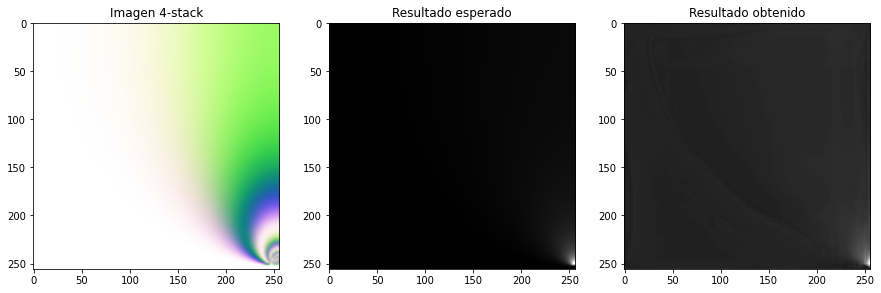

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

562


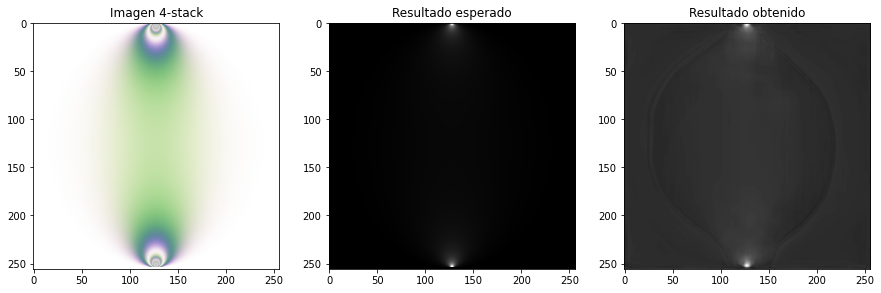

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

**Model8_100e_4b_256_15000**

431


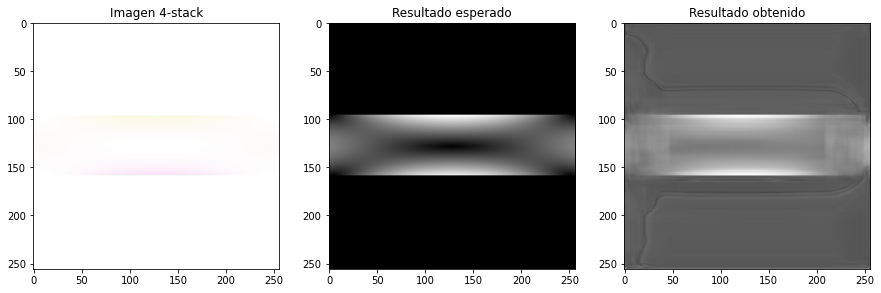

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

207


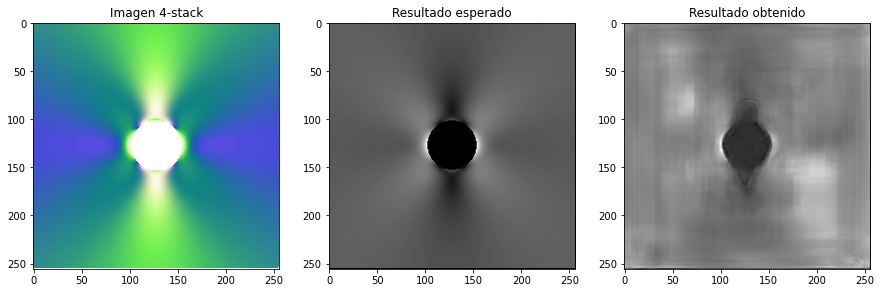

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

577


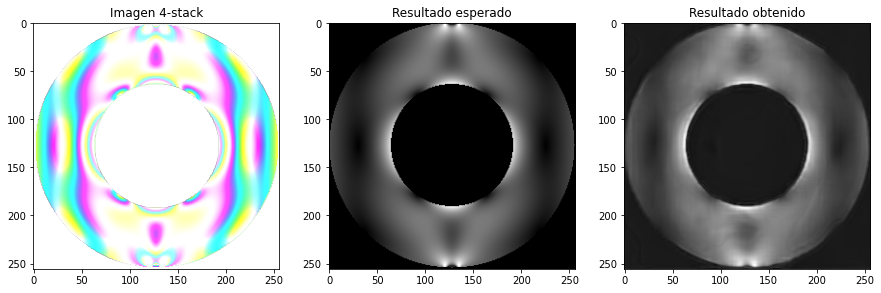

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

255


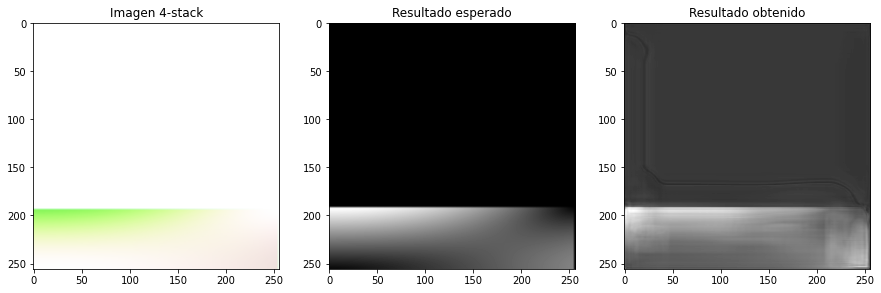

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

341


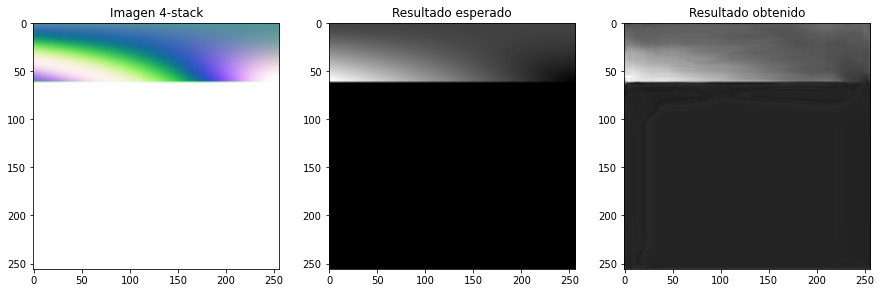

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

**Model8_100e_4b_256_17500**

336


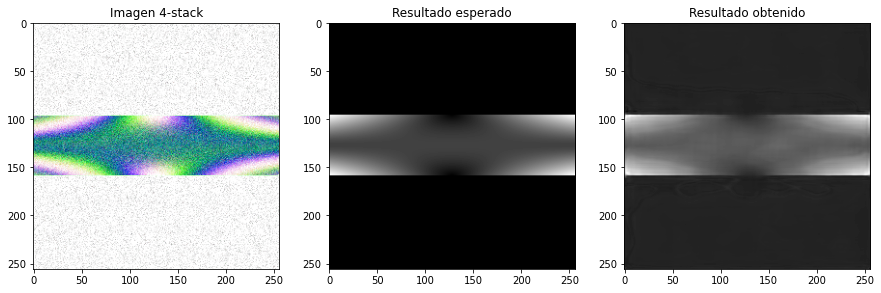

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

23


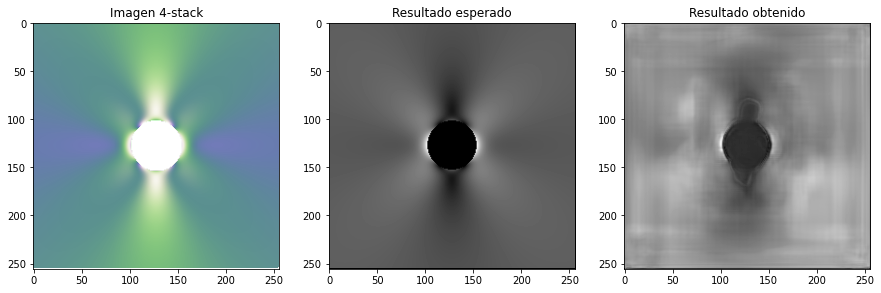

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

291


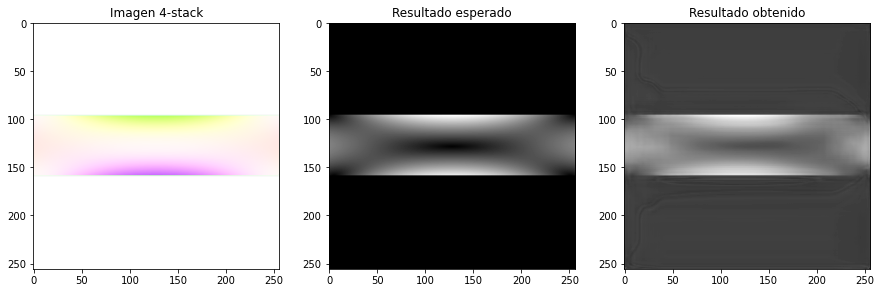

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

455


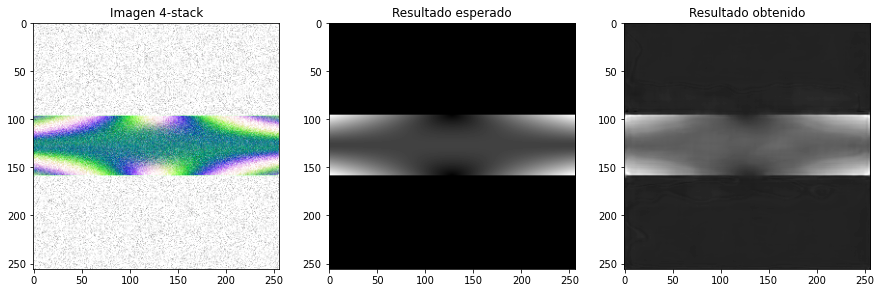

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

36


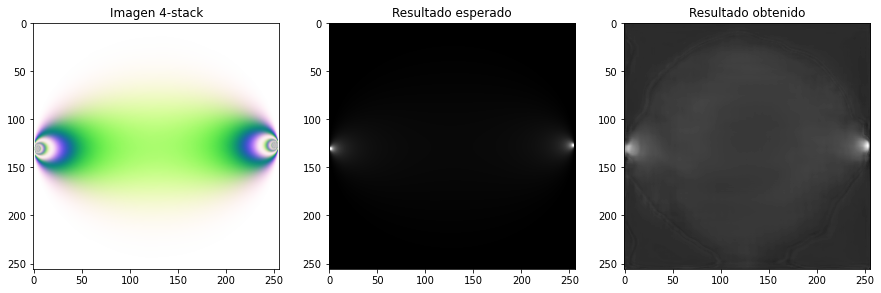

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

**Model8_100e_4b_256_20000**

360


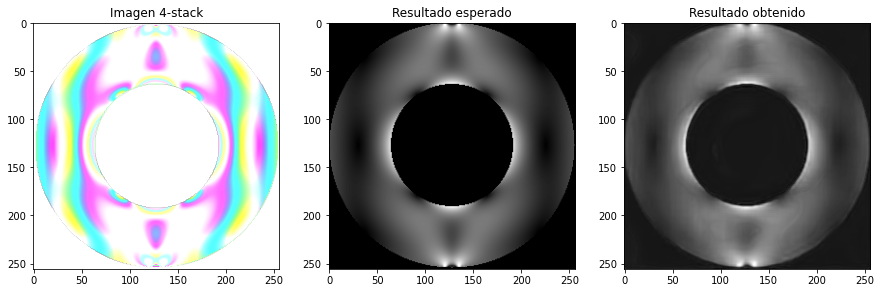

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

529


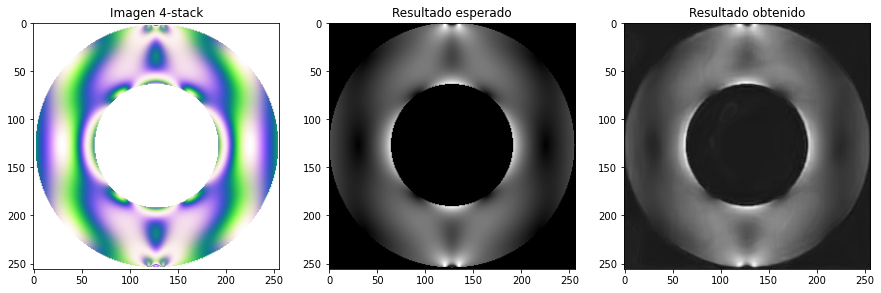

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

319


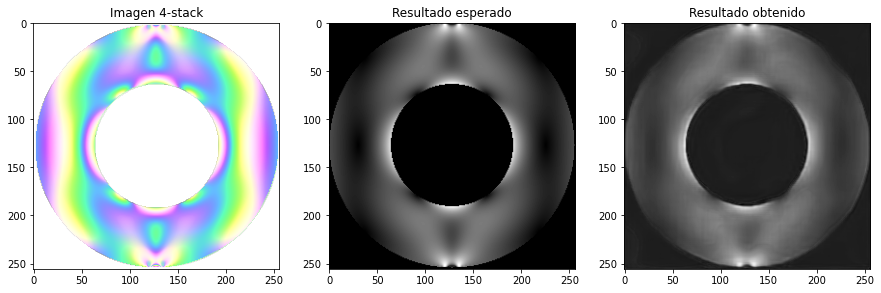

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

420


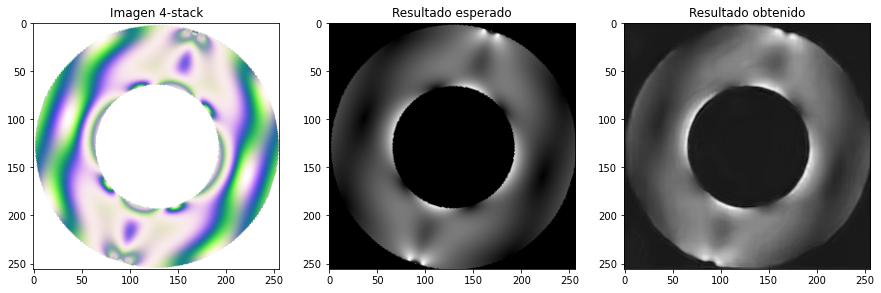

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

556


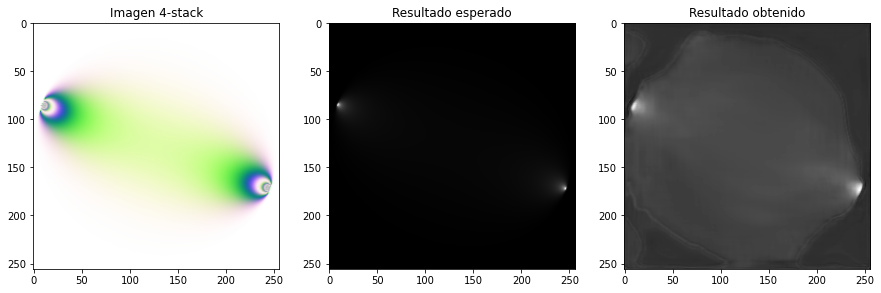

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

**Model8_100e_4b_256_22500**

124


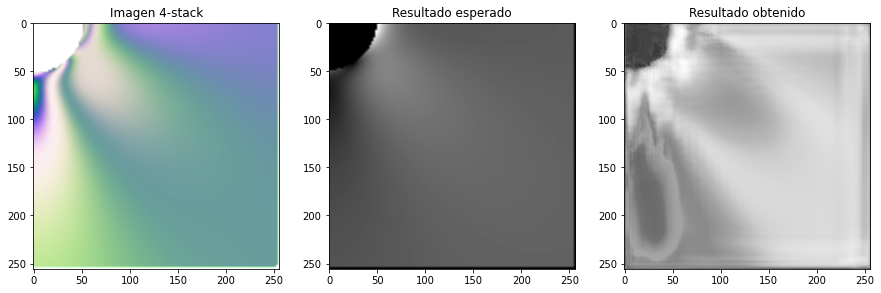

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_22500.h5', 4)

497


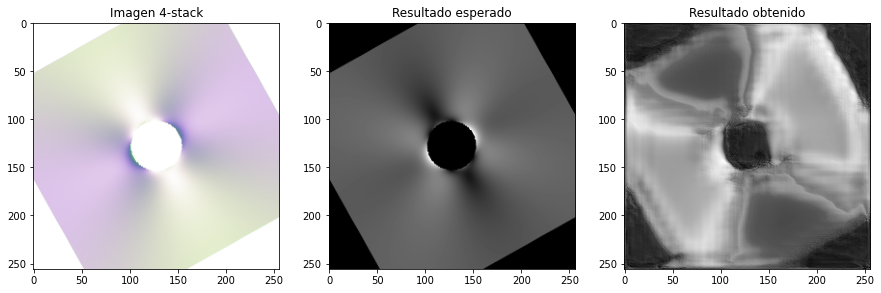

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_22500.h5', 4)

208


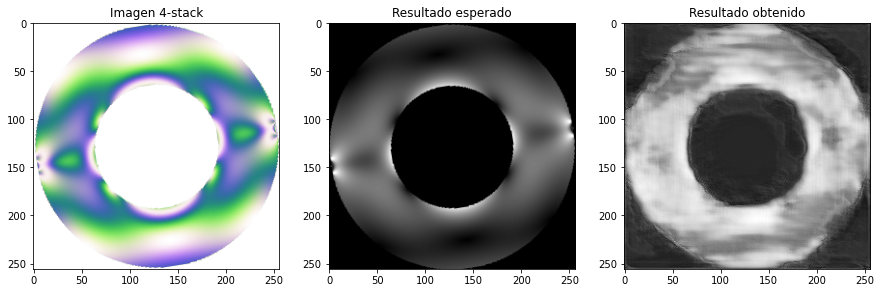

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_22500.h5', 4)

611


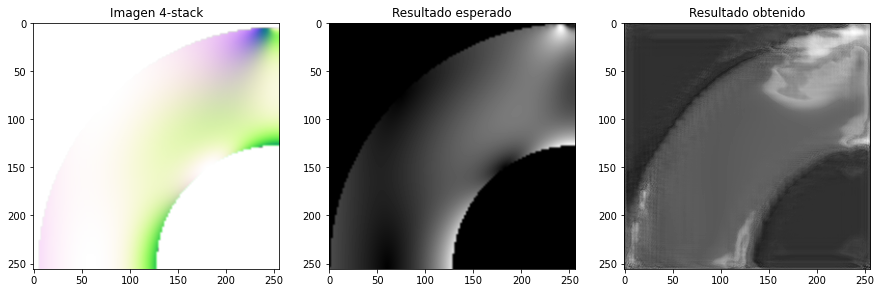

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_22500.h5', 4)

**Model8_100e_4b_256_25000**

359


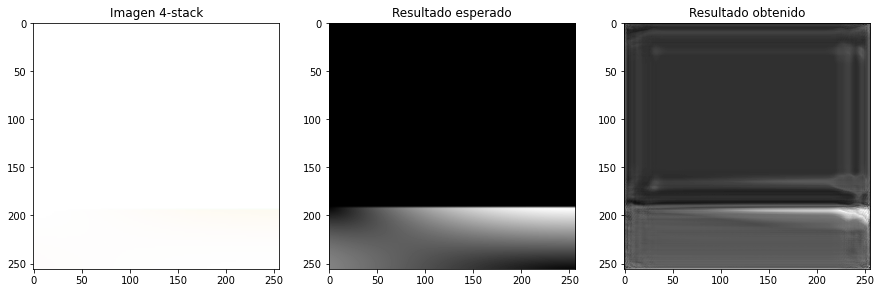

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_25000.h5', 4)

34


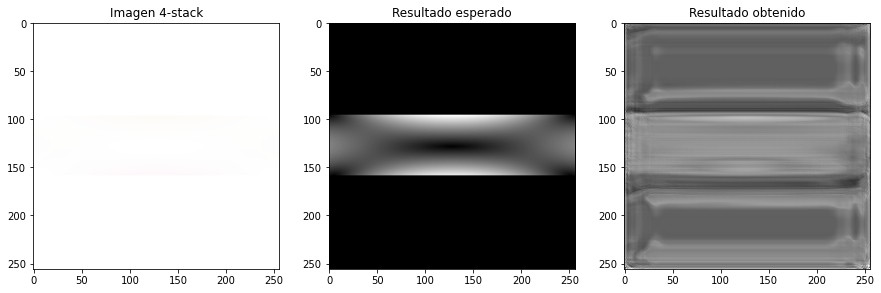

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_25000.h5', 4)

231


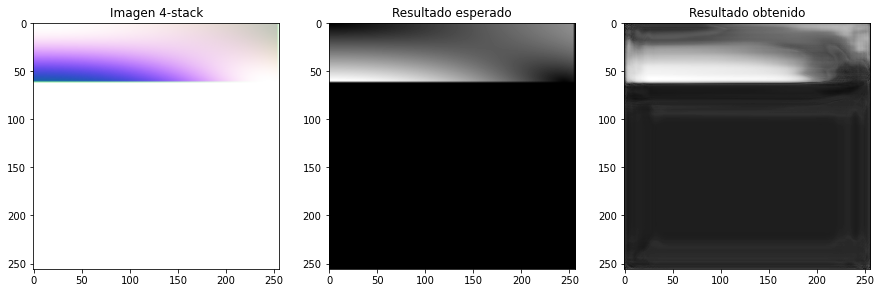

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_25000.h5', 4)

127


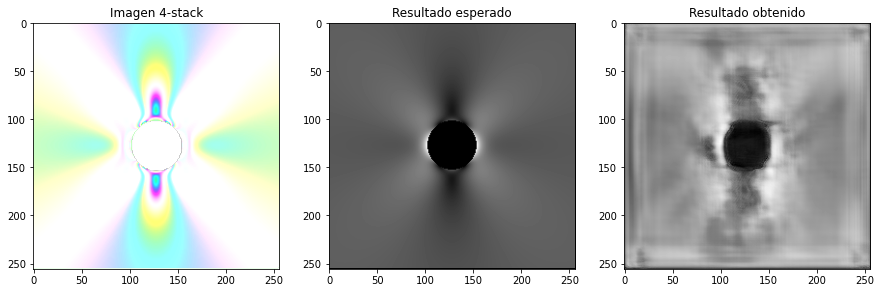

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_25000.h5', 4)

**Model8_100e_4b_256_27500**

618


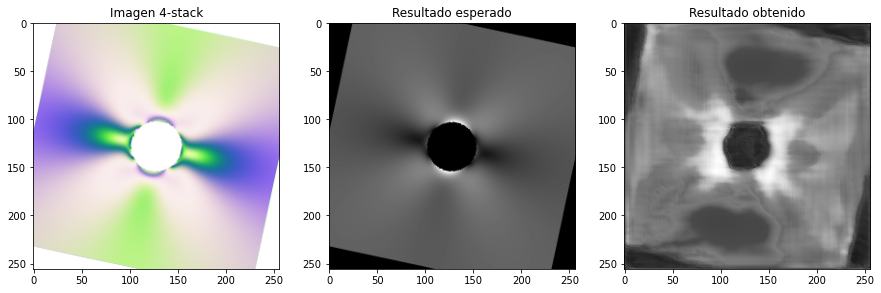

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_27500.h5', 4)

52


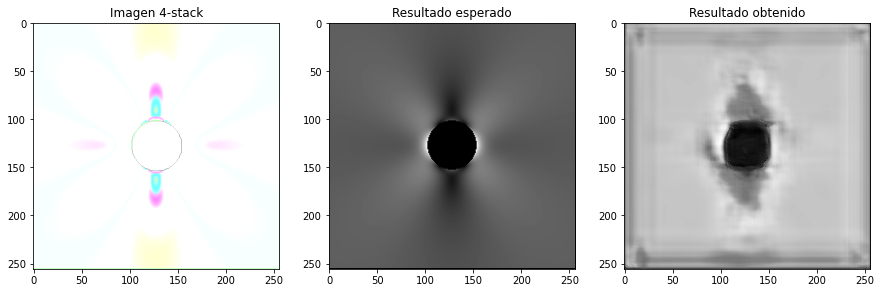

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_27500.h5', 4)

346


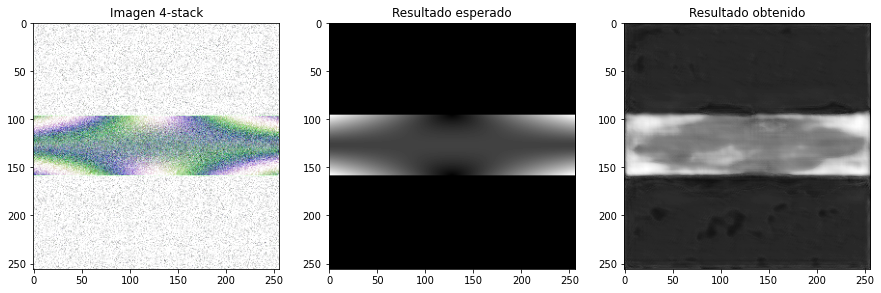

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_27500.h5', 4)

570


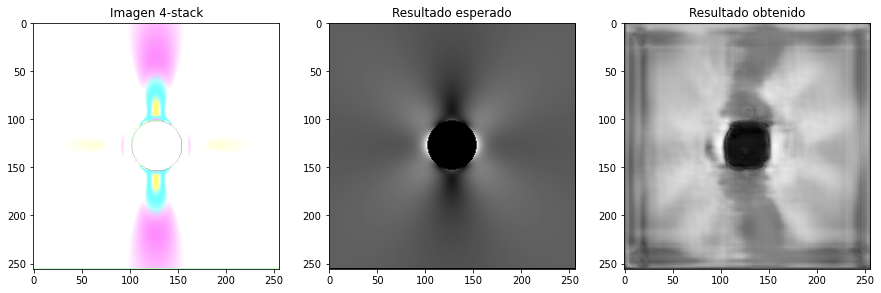

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_27500.h5', 4)

**Model8_100e_4b_256_30000**

547


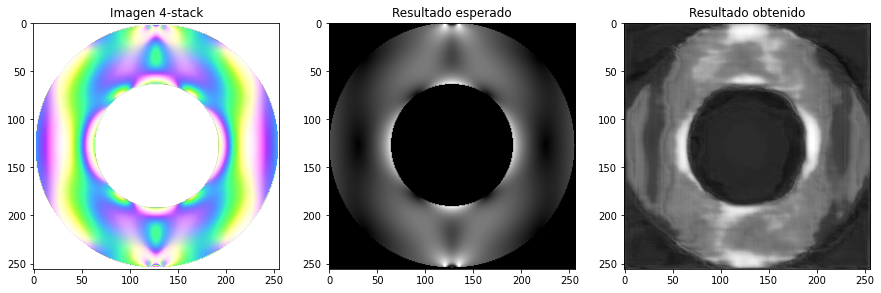

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_30000.h5', 4)

139


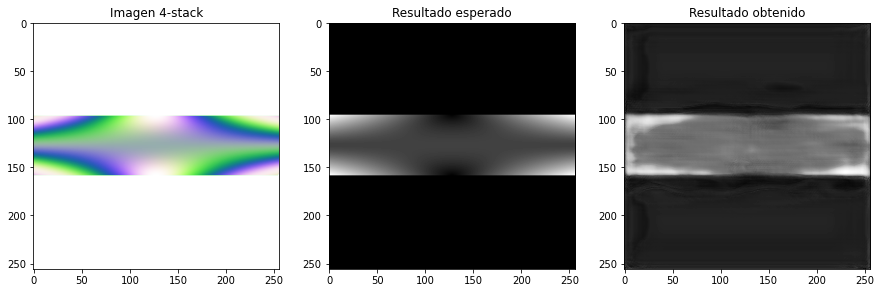

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_30000.h5', 4)

162


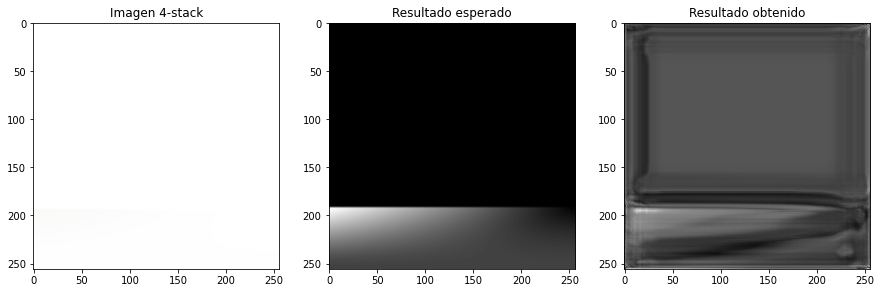

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_30000.h5', 4)

363


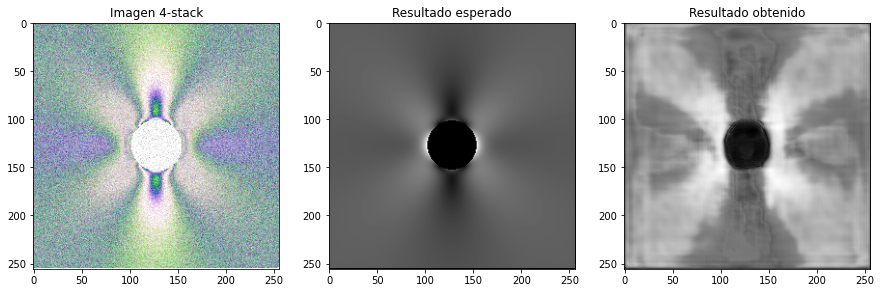

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_30000.h5', 4)

**Model8_100e_4b_256_32500**

210


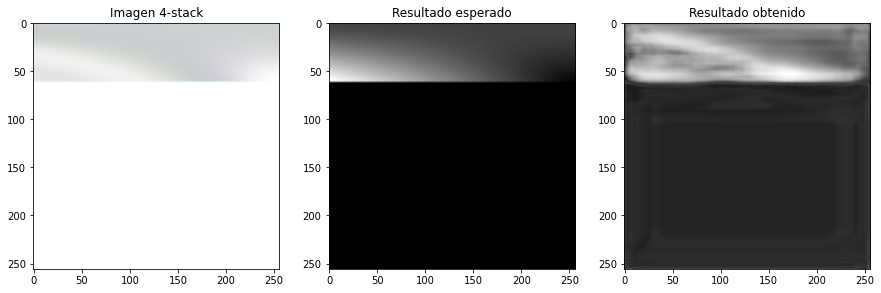

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_32500.h5', 4)

93


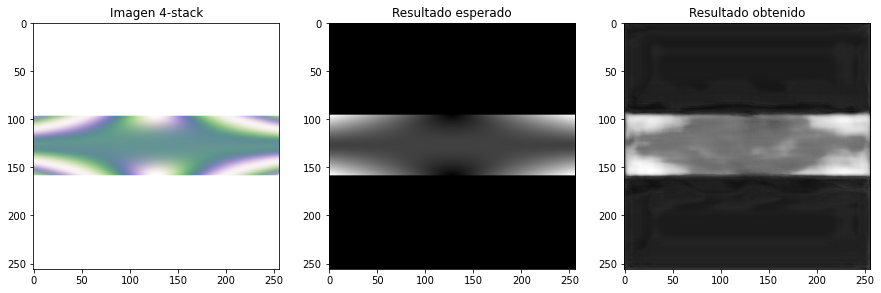

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_32500.h5', 4)

460


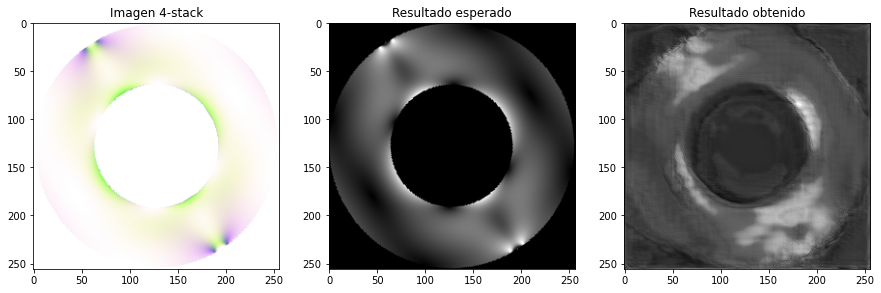

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_32500.h5', 4)

289


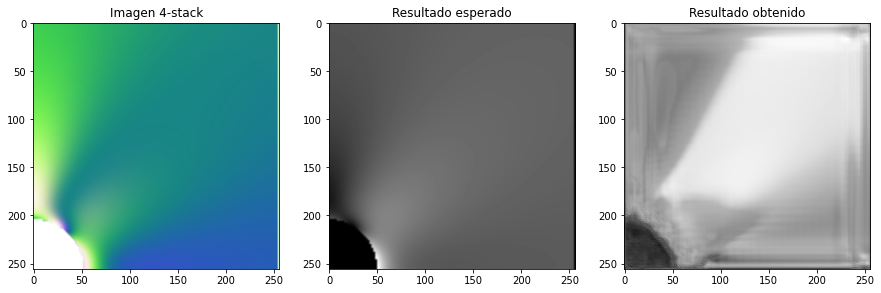

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_32500.h5', 4)

**Model8_100e_4b_256_35000**

502


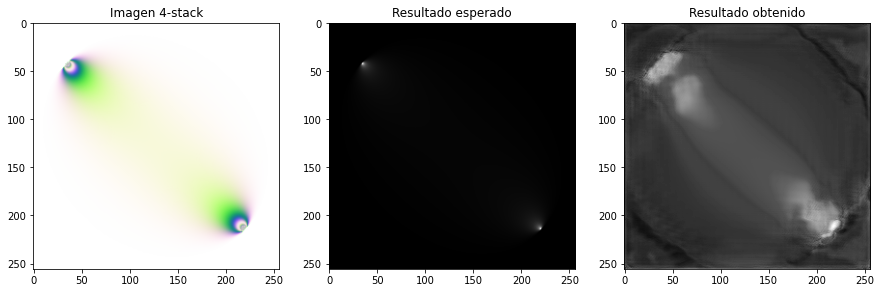

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_35000.h5', 4)

498


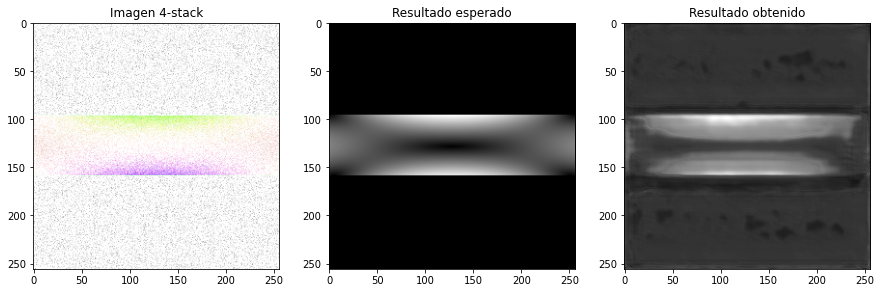

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_35000.h5', 4)

189


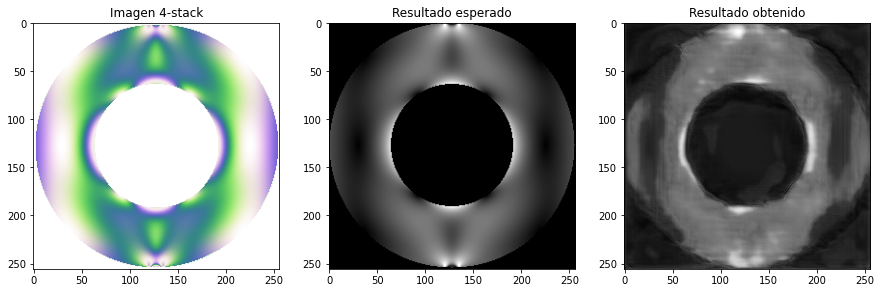

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_35000.h5', 4)

489


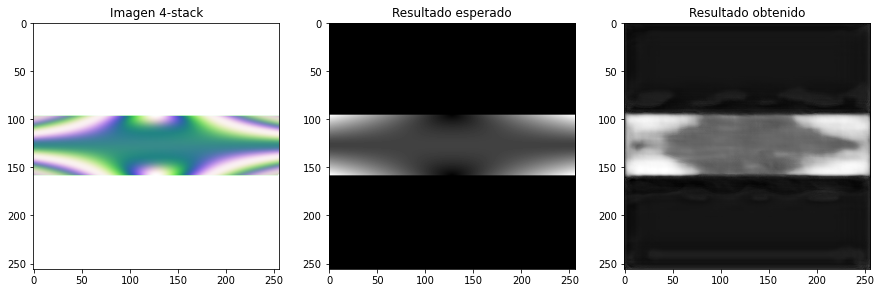

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_35000.h5', 4)

**Model8_100e_4b_256_36000**

205


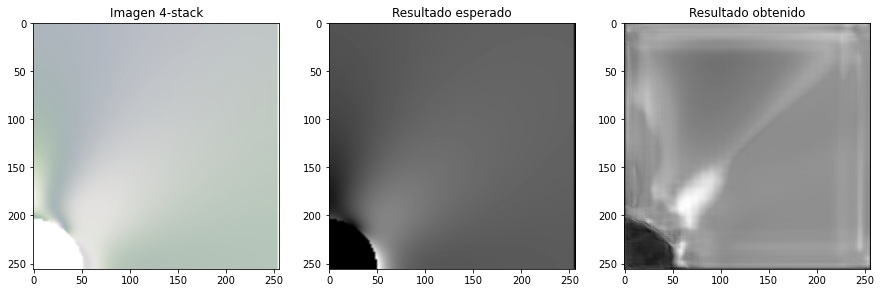

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_36000.h5', 4)

142


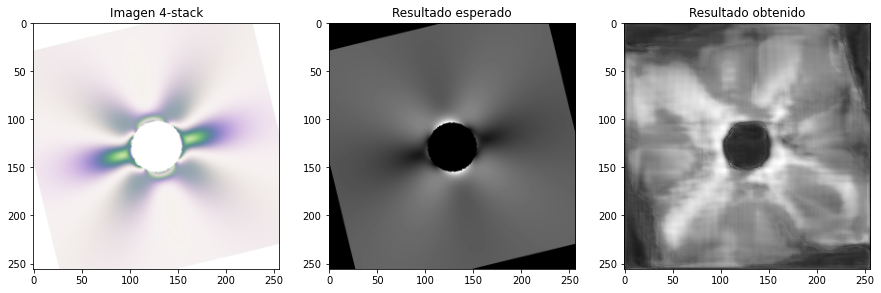

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_36000.h5', 4)

228


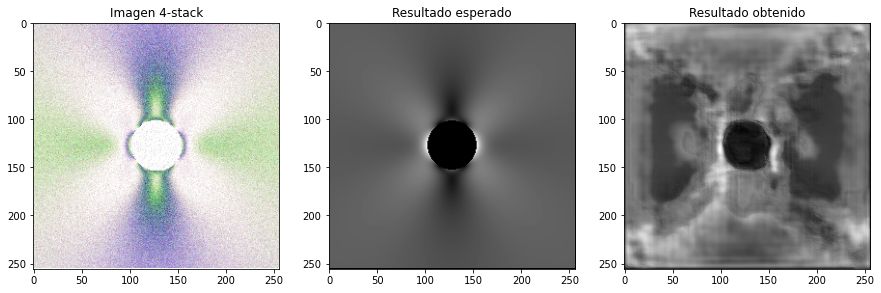

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_36000.h5', 4)

96


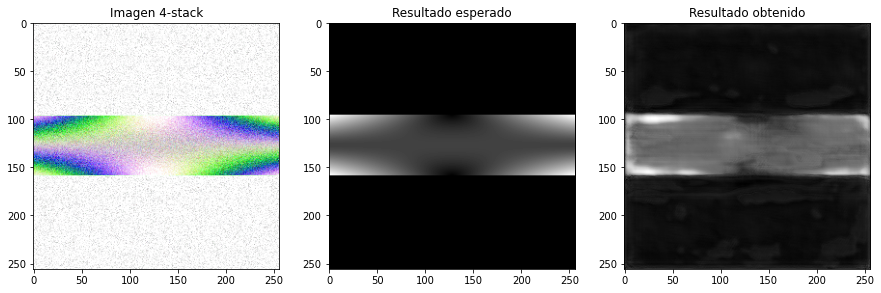

In [ ]:
show_results(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_36000.h5', 4)

## **Métricas MSE, SSIM y PSNR Promedio por modelo**

In [ ]:
pip install git+https://github.com/chaofengc/IQA-PyTorch.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/chaofengc/IQA-PyTorch.git to /tmp/pip-req-build-5di8a_86
  Running command git clone --filter=blob:none --quiet https://github.com/chaofengc/IQA-PyTorch.git /tmp/pip-req-build-5di8a_86
  Resolved https://github.com/chaofengc/IQA-PyTorch.git to commit 0afec469398488cc97140e7708d8e662c52875b6
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-_f3pigli/clip_7c181874d3fb49ca8a8b38db18a61942
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-_f3pigli/clip_7c181874d3fb49ca8a8b38db18a61942
  Resolved https://github.com/openai/CLIP.git to commit 3702849800aa56e2223035bccd1c6ef91c704ca8
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 55.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 

In [ ]:
pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pyiqa
import torch

# list all available metrics
print(pyiqa.list_models())

['ahiq', 'brisque', 'ckdn', 'clipiqa', 'clipiqa+', 'cnniqa', 'cw_ssim', 'dbcnn', 'dists', 'fid', 'fsim', 'gmsd', 'ilniqe', 'lpips', 'lpips-vgg', 'mad', 'maniqa', 'ms_ssim', 'musiq', 'musiq-ava', 'musiq-koniq', 'musiq-paq2piq', 'musiq-spaq', 'nima', 'nima-vgg16-ava', 'niqe', 'nlpd', 'nrqm', 'paq2piq', 'pi', 'pieapp', 'psnr', 'psnry', 'ssim', 'ssimc', 'vif', 'vsi']


#### **Función de cómputo de métricas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
import pyiqa
import torch

def metrics(model, url, bs):

  # Llamar métricas
  brisque = pyiqa.create_metric('brisque')
  dbcnn = pyiqa.create_metric('dbcnn')
  nima = pyiqa.create_metric('nima')
  nrqm = pyiqa.create_metric('nrqm')
  ckdn = pyiqa.create_metric('ckdn')
  dists = pyiqa.create_metric('dists')
  lpips = pyiqa.create_metric('lpips')

  # Prediccion
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)

  # ----- Creacion Arrays ------
  # Metricas tradicionales
  mse_array = np.array([])
  ssim_array = np.array([])
  psnr_array = np.array([])

  # Metricas No Reference
  brisque_array = np.array([])
  dbcnn_array = np.array([])
  nima_array = np.array([])
  nrqm_array = np.array([])

  # Metricas Full Reference
  ckdn_array = np.array([])
  dists_array = np.array([])
  lpips_array = np.array([])

  for i in range(S_test.shape[0]):

    #  Nomenclatura resultados
    exp = P_test[i][:,:,0]
    pred = y_pred[i][:,:,0]

    # Procesamiento para metricas de iqa
    new_arr1 = np.expand_dims(y_pred[i], 0)
    new_arr2 = np.expand_dims(P_test[i], 0)
    new_arr1 = new_arr1.reshape((1,1,256,256))
    new_arr2 = new_arr2.reshape((1,1,256,256))
    tensor1 = torch.from_numpy(new_arr1)
    tensor2 = torch.from_numpy(new_arr2)

    # -------------- Calculo de metricas -------------------------
    # Metricas tradicionales
    mse_res = mse(exp, pred)
    ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
    psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

    # Metricas No Reference
    brisque_res = brisque(tensor1).item()
    dbcnn_res = dbcnn(tensor1).item()
    nima_res = nima(tensor1).item()
    nrqm_res = nrqm(tensor1).item()

    # Metricas Full Reference
    ckdn_res = ckdn(tensor1, tensor2).item()
    dists_res = dists(tensor1, tensor2).item()
    lpips_res = lpips(tensor1, tensor2).item()

    # -------------- Almacenamiento de metricas -------------------------
    # Metricas tradicionales
    mse_array = np.append(mse_array, mse_res)
    ssim_array = np.append(ssim_array, ssim_res)
    psnr_array = np.append(psnr_array, psnr_res)

    # Metricas No Reference
    brisque_array = np.append(brisque_array, brisque_res)
    dbcnn_array = np.append(dbcnn_array, dbcnn_res)
    nima_array = np.append(nima_array, nima_res)
    nrqm_array = np.append(nrqm_array, nrqm_res)

    # Metricas Full Reference
    ckdn_array = np.append(ckdn_array, ckdn_res)
    dists_array = np.append(dists_array, dists_res)
    lpips_array = np.append(lpips_array, lpips_res)

    print('\r' + str(i), end='')

  # ----------- Imprimir valores ------------------------
  print('--------Metricas tradicionales----------')
  print('Mean MSE: ' + repr(mse_array.mean()))
  print('Std. Dev MSE: ' + repr(mse_array.std()))
  print('Mean SSIM: ' + repr(ssim_array.mean()))
  print('Std. Dev SSIM: ' + repr(ssim_array.std()))
  print('Mean PSNR: ' + repr(psnr_array.mean()))
  print('Std. Dev PSNR: ' + repr(psnr_array.std()))
  print('--------Metricas No Reference----------')
  print('Mean Brisque: ' + repr(brisque_array.mean()))
  print('Std. Dev Brisque: ' + repr(brisque_array.std()))
  print('Mean DBCNN: ' + repr(dbcnn_array.mean()))
  print('Std. Dev DBCNN: ' + repr(dbcnn_array.std()))
  print('Mean nima: ' + repr(nima_array.mean()))
  print('Std. Dev nima: ' + repr(nima_array.std()))
  print('Mean nrqm: ' + repr(nrqm_array.mean()))
  print('Std. Dev nrqm: ' + repr(nrqm_array.std()))
  print('--------Metricas Full Reference----------')
  print('Mean ckdn: ' + repr(ckdn_array.mean()))
  print('Std. Dev ckdn: ' + repr(ckdn_array.std()))
  print('Mean dists: ' + repr(dists_array.mean()))
  print('Std. Dev dists: ' + repr(dists_array.std()))
  print('Mean lpips: ' + repr(lpips_array.mean()))
  print('Std. Dev lpips: ' + repr(lpips_array.std()))

  #Show one example
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Original image
  mse_none = mse(exp, exp)
  ssim_none = ssim(exp, exp, data_range=exp.max() - exp.min())
  psnr_none = psnr(exp, exp, data_range=exp.max() - exp.min())
  #Result image
  ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
  psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

  ax[0].imshow(exp, cmap='gray')
  ax[0].set_xlabel(f'MSE: {mse_none:.2f}, SSIM: {ssim_none:.7f}, PSNR: {psnr_none:.2f}')
  ax[0].set_title('Expected image')

  ax[1].imshow(pred, cmap='gray')
  ax[1].set_xlabel(f'MSE: {mse_res:.8f}, SSIM: {ssim_res:.2f}, PSNR: {psnr_res:.2f}')
  ax[1].set_title('Result image')

  plt.tight_layout()
  plt.show()

  return mse_array.mean(), mse_array.std(), ssim_array.mean(), ssim_array.std(), psnr_array.mean(), psnr_array.std(), brisque_array.mean(), brisque_array.std(), dbcnn_array.mean(), dbcnn_array.std(), nima_array.mean(), nima_array.std(), nrqm_array.mean(), nrqm_array.std(), ckdn_array.mean(), ckdn_array.std(), dists_array.mean(), dists_array.std(), lpips_array.mean(), lpips_array.std()

#### **Model8_100e_4b_256_2500**

In [ ]:
metrics2500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_2500.h5', 4)

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
163/163 [==============================] - 2s 10ms/step
471

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics2500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet4_2500.xlsx')

**Model8_100e_4b_256_5000**

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth
Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0011575066378859728
Std. Dev MSE: 0.001780762791099601
Mean SSIM: 0.539932629303917
Std. Dev SSIM: 0.194731654196625
Mean PSNR: 27.551807742136983
Std. Dev PSNR: 4.838531507725739
--------Metricas No Reference----------
Mean Brisque: 74.74126513671875
Std. Dev Brisque: 6.685753914482769
Mean DBCNN: 35.56946971740722
Std. Dev DBCNN: 4.363220063811131
Mean nima: 5.153168483734131
Std. Dev nima: 0.3975579060907087
Mean nrqm: 1.990196364402771
Std. D

/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


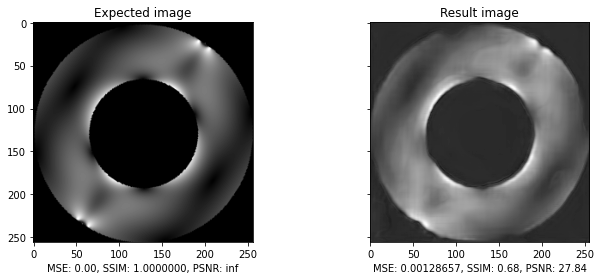

In [ ]:
metrics5000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_5000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics5000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_5000.xlsx')

**Model8_100e_4b_256_7500**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
157/157 [==============================] - 2s 10ms/step
624--------Metricas tradicionales----------
Mean MSE: 0.0009748130584425113
Std. Dev MSE: 0.0020293274372549515
Mean SSIM: 0.7801851790695388
Std. Dev SSIM: 0.14549803104228795
Mean PSNR: 29.310858540673337
Std. Dev PSNR: 5.79502400768406
--------Metricas No Reference----------
Mean Brisque: 74.07400654296875
Std. Dev Brisque: 7.808706778495506
Mean DBCNN: 36.7663025177002
Std. Dev DBCNN: 4.781080057628322
Mean nima: 4.742803116989136
Std. Dev nima: 0.5807853153791095
Mean nrqm: 2.676236949157715
Std. Dev nrqm: 0.48244719203516295
--------Metricas Full Reference----------
Mean ckdn: 0.4923571141719818
Std. Dev ckdn: 0.037225937924424184
Mean dists: 0.29875308456420896
Std. Dev dists: 0.06526127700536441
Mean lpips: 0.10366131661757827
Std. Dev lpips: 0.06008016150119588


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


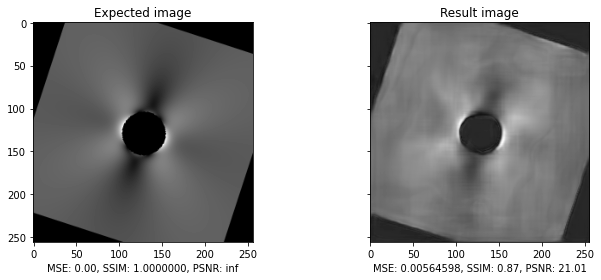

In [ ]:
metrics7500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_7500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics7500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_7500.xlsx')

**Model8_100e_4b_256_10000**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0012606712106161837
Std. Dev MSE: 0.002450754000504662
Mean SSIM: 0.7165327733521082
Std. Dev SSIM: 0.1650656689867574
Mean PSNR: 27.18945752512099
Std. Dev PSNR: 5.46276794438308
--------Metricas No Reference----------
Mean Brisque: 76.47825888671875
Std. Dev Brisque: 7.32813841699473
Mean DBCNN: 35.85543684387207
Std. Dev DBCNN: 4.461405872113593
Mean nima: 5.070043811416626
Std. Dev nima: 0.4361986806619684
Mean nrqm: 1.9930757677078248
Std. Dev nrqm: 0.07037967410782278
--------Metricas Full Reference----------
Mean ckdn: 0.4927248297214508
Std. Dev ckdn: 0.03396639691072591
Mean dists: 0.31627079305648803
Std. Dev dists: 0.07469706795693393
Mean lpips: 0.11151761713624
Std. Dev lpips: 0.05454863535474088


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


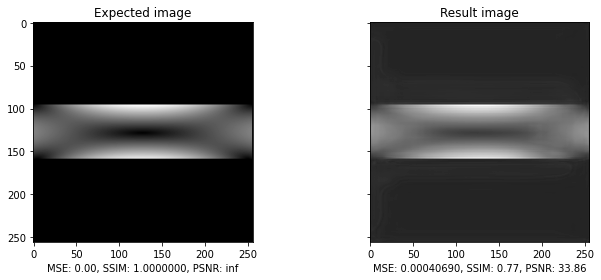

In [ ]:
metrics10000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_10000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics10000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_10000.xlsx')

**Model8_100e_4b_256_12500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.001075103961123948
Std. Dev MSE: 0.002046130596393898
Mean SSIM: 0.7362902921804282
Std. Dev SSIM: 0.19164533783307977
Mean PSNR: 28.823499621895852
Std. Dev PSNR: 5.8309307219882855
--------Metricas No Reference----------
Mean Brisque: 75.12988388671874
Std. Dev Brisque: 7.476743939262284
Mean DBCNN: 37.423038656616214
Std. Dev DBCNN: 4.868173147124061
Mean nima: 5.139125302886963
Std. Dev nima: 0.40914431952403635
Mean nrqm: 2.010507808494568
Std. Dev nrqm: 0.06410323337360918
--------Metricas Full Reference----------
Mean ckdn: 0.4973355067253113
Std. Dev ckdn: 0.03592050163047421
Mean dists: 0.3078962629318237
Std. Dev dists: 0.07115020237717348
Mean lpips: 0.10987966432869434
Std. Dev lpips: 0.06026458216917339


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


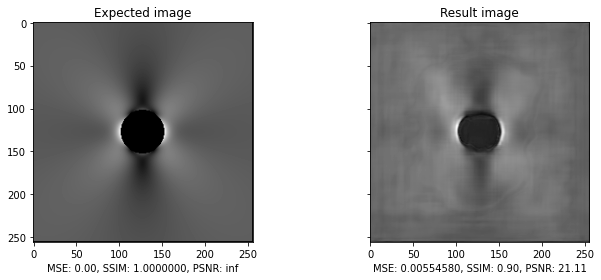

In [ ]:
metrics12500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_12500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics12500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_12500.xlsx')

**Model8_100e_4b_256_15000**

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0007966436524149608
Std. Dev MSE: 0.0018747143219768894
Mean SSIM: 0.7159125936670196
Std. Dev SSIM: 0.17435304707594268
Mean PSNR: 30.34820121755146
Std. Dev PSNR: 6.5882939975528405
--------Metricas No Reference----------
Mean Brisque: 73.44178818359374
Std. Dev Brisque: 8.270833462045404
Mean DBCNN: 36.395289227294924
Std. Dev DBCNN: 4.565063923454389
Mean nima: 5.124915807342529
Std. Dev nima: 0.3687039754051858
Mean nrqm: 1.9977043865203858
Std. Dev nrqm: 0.06538698164680887
--------Metricas Full Reference----------
Mean ckdn: 0.5017416790962219
Std. Dev ckdn: 0.03313615407039692
Mean dists: 0.30441116008758545
Std. Dev dists: 0.06391425525470942
Mean lpips: 0.09616589915454388
Std. Dev lpips: 0.0530210210502532


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


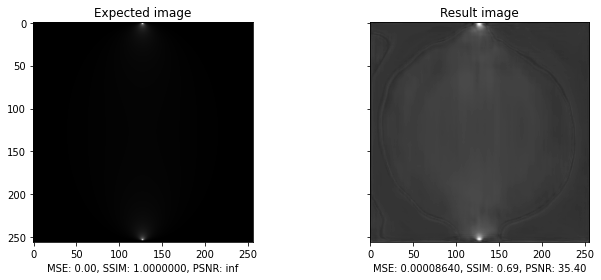

In [ ]:
metrics15000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_15000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics15000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_15000.xlsx')

**Model8_100e_4b_256_17500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0009523076699232198
Std. Dev MSE: 0.002124872737639084
Mean SSIM: 0.7938182017336248
Std. Dev SSIM: 0.15696787687414493
Mean PSNR: 29.07900910402797
Std. Dev PSNR: 6.503521608644552
--------Metricas No Reference----------
Mean Brisque: 76.18221669921876
Std. Dev Brisque: 8.926306922776732
Mean DBCNN: 36.59725165710449
Std. Dev DBCNN: 4.876936154748346
Mean nima: 5.035701424407959
Std. Dev nima: 0.4098377430059
Mean nrqm: 2.002895105934143
Std. Dev nrqm: 0.06816914644315973
--------Metricas Full Reference----------
Mean ckdn: 0.5015938024997711
Std. Dev ckdn: 0.032096430818891054
Mean dists: 0.29425522603988646
Std. Dev dists: 0.06658129024038695
Mean lpips: 0.08865596833229065
Std. Dev lpips: 0.05238045190347178


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


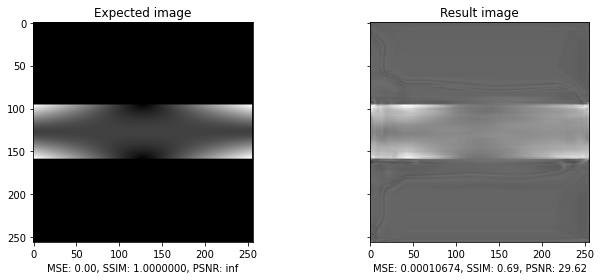

In [ ]:
metrics17500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_17500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics17500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_17500.xlsx')

**Model8_100e_4b_256_20000**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0008670783117165703
Std. Dev MSE: 0.0015664435187154359
Mean SSIM: 0.6547672114465035
Std. Dev SSIM: 0.1991940530831509
Mean PSNR: 28.85300810550706
Std. Dev PSNR: 6.106149439325887
--------Metricas No Reference----------
Mean Brisque: 76.88060380859375
Std. Dev Brisque: 10.231542670420753
Mean DBCNN: 36.557905795288086
Std. Dev DBCNN: 5.211282541540062
Mean nima: 5.078043769836426
Std. Dev nima: 0.4089884427572245
Mean nrqm: 1.9900053197860719
Std. Dev nrqm: 0.0667069541897178
--------Metricas Full Reference----------
Mean ckdn: 0.4992320993900299
Std. Dev ckdn: 0.031133414349113653
Mean dists: 0.300119810962677
Std. Dev dists: 0.06891358584198036
Mean lpips: 0.08587939642369748
Std. Dev lpips: 0.04911175357238895


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


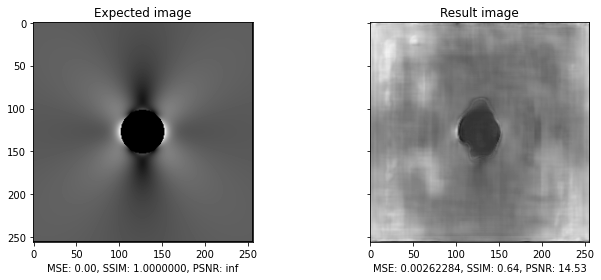

In [ ]:
metrics20000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_20000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics20000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_20000.xlsx')

**Model8_100e_4b_256_22500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.005006577609808042
Std. Dev MSE: 0.0048197147376928704
Mean SSIM: 0.32077080330564595
Std. Dev SSIM: 0.14882134953452744
Mean PSNR: 16.155043660743644
Std. Dev PSNR: 3.4643369023162727
--------Metricas No Reference----------
Mean Brisque: 40.57979560546875
Std. Dev Brisque: 21.700122164418897
Mean DBCNN: 29.586297161865236
Std. Dev DBCNN: 4.312568183562135
Mean nima: 5.401110364532471
Std. Dev nima: 0.33842461308793753
Mean nrqm: 2.218557785606384
Std. Dev nrqm: 0.2796524401248497
--------Metricas Full Reference----------
Mean ckdn: 0.4587120764255524
Std. Dev ckdn: 0.04904153799851962
Mean dists: 0.40364973287582395
Std. Dev dists: 0.0665887993189566
Mean lpips: 0.2683202283203602
Std. Dev lpips: 0.09965507529522306


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


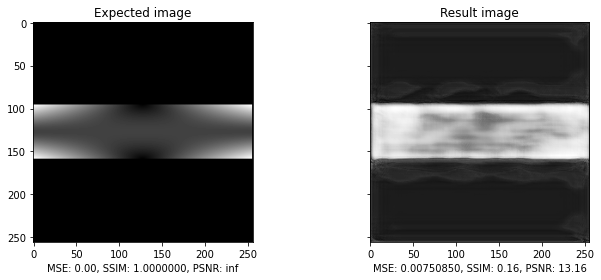

In [ ]:
metrics22500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_22500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics22500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_22500.xlsx')

**Model8_100e_4b_256_25000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.003580301792827845
Std. Dev MSE: 0.004001082868594652
Mean SSIM: 0.4038564014909833
Std. Dev SSIM: 0.15735490571772498
Mean PSNR: 19.349086222276835
Std. Dev PSNR: 3.6816560532382643
--------Metricas No Reference----------
Mean Brisque: 45.39480302734375
Std. Dev Brisque: 17.8441024157262
Mean DBCNN: 27.770964169311522
Std. Dev DBCNN: 4.56042759681592
Mean nima: 5.275372288513184
Std. Dev nima: 0.398178273537676
Mean nrqm: 2.1404011892318726
Std. Dev nrqm: 0.23426030619110927
--------Metricas Full Reference----------
Mean ckdn: 0.4483819673538208
Std. Dev ckdn: 0.055113313564115696
Mean dists: 0.4127401184082031
Std. Dev dists: 0.057935640440123684
Mean lpips: 0.26882094419002533
Std. Dev lpips: 0.10057997422480774


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


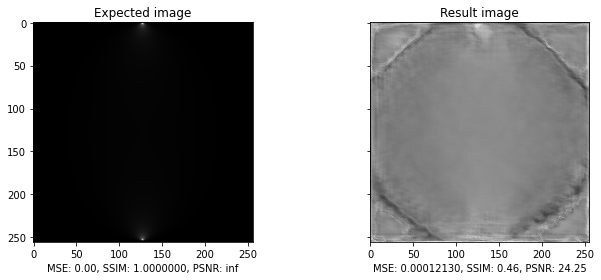

In [ ]:
metrics25000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_25000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics25000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_25000.xlsx')

**Model8_100e_4b_256_27500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0033070391337108474
Std. Dev MSE: 0.003767914929316791
Mean SSIM: 0.4281198423952592
Std. Dev SSIM: 0.13723313317402247
Mean PSNR: 19.292384440921918
Std. Dev PSNR: 3.525814402689684
--------Metricas No Reference----------
Mean Brisque: 46.64422919921875
Std. Dev Brisque: 17.110232841371893
Mean DBCNN: 27.877011663818358
Std. Dev DBCNN: 4.100084981436784
Mean nima: 5.252678350067138
Std. Dev nima: 0.39096314774112023
Mean nrqm: 2.167433016395569
Std. Dev nrqm: 0.24961009069631243
--------Metricas Full Reference----------
Mean ckdn: 0.4519537813663483
Std. Dev ckdn: 0.052365491292840856
Mean dists: 0.4086255828857422
Std. Dev dists: 0.05603626925714144
Mean lpips: 0.2548573301553726
Std. Dev lpips: 0.09124446681196742


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


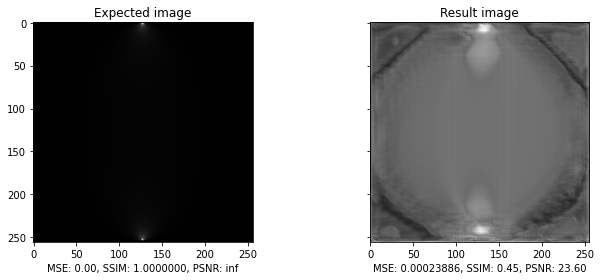

In [ ]:
metrics27500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_27500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics27500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_27500.xlsx')

**Model8_100e_4b_256_30000**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0034806097982488893
Std. Dev MSE: 0.003883269999035925
Mean SSIM: 0.5073071489717736
Std. Dev SSIM: 0.12311269924312308
Mean PSNR: 19.30036978740424
Std. Dev PSNR: 3.679910714076424
--------Metricas No Reference----------
Mean Brisque: 47.14469560546875
Std. Dev Brisque: 16.230307373884887
Mean DBCNN: 27.88015445251465
Std. Dev DBCNN: 3.9159217175136507
Mean nima: 5.225014685058594
Std. Dev nima: 0.3545756244793563
Mean nrqm: 2.1530159873962402
Std. Dev nrqm: 0.22695559783985828
--------Metricas Full Reference----------
Mean ckdn: 0.45993343601226805
Std. Dev ckdn: 0.05273811343860134
Mean dists: 0.40216841049194335
Std. Dev dists: 0.0649838113156446
Mean lpips: 0.251623337751627
Std. Dev lpips: 0.0992949152347812


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


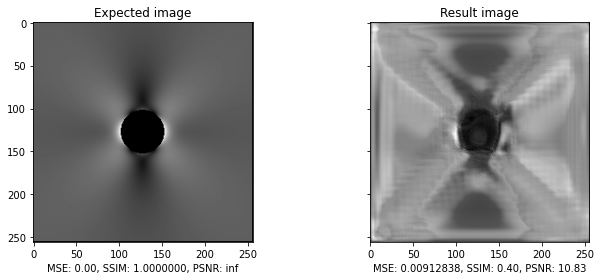

In [ ]:
metrics30000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_30000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics30000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_30000.xlsx')

**Model8_100e_4b_256_32500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0033650457688383013
Std. Dev MSE: 0.0035511575132266423
Mean SSIM: 0.46996064806118776
Std. Dev SSIM: 0.1253390430547827
Mean PSNR: 19.273118218713428
Std. Dev PSNR: 3.4683560137891263
--------Metricas No Reference----------
Mean Brisque: 48.62043310546875
Std. Dev Brisque: 16.05948270817666
Mean DBCNN: 27.647477770996094
Std. Dev DBCNN: 3.933841131627729
Mean nima: 5.2603937492370605
Std. Dev nima: 0.3759541647185422
Mean nrqm: 2.141287773132324
Std. Dev nrqm: 0.22234322045594168
--------Metricas Full Reference----------
Mean ckdn: 0.448927978181839
Std. Dev ckdn: 0.053844360402222034
Mean dists: 0.3996477025985718
Std. Dev dists: 0.05895205825377066
Mean lpips: 0.25139904259443285
Std. Dev lpips: 0.0989169612201515


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


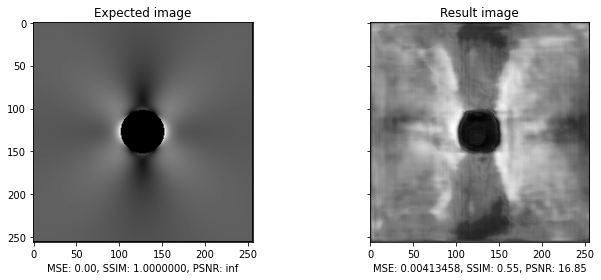

In [ ]:
metrics32500 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_32500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics32500).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_32500.xlsx')

**Model8_100e_4b_256_35000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.002838118097015441
Std. Dev MSE: 0.0030988529292896518
Mean SSIM: 0.352089439047774
Std. Dev SSIM: 0.18513788918936916
Mean PSNR: 19.983514787829346
Std. Dev PSNR: 3.1942576439681867
--------Metricas No Reference----------
Mean Brisque: 54.53786552734375
Std. Dev Brisque: 17.918103666247024
Mean DBCNN: 26.620615686035155
Std. Dev DBCNN: 3.8726920424996223
Mean nima: 5.157119191741943
Std. Dev nima: 0.41745974794220847
Mean nrqm: 2.1186143718719483
Std. Dev nrqm: 0.20027817395049383
--------Metricas Full Reference----------
Mean ckdn: 0.45837643671035766
Std. Dev ckdn: 0.05349964984261452
Mean dists: 0.4036017770767212
Std. Dev dists: 0.06593068095023676
Mean lpips: 0.2448790935099125
Std. Dev lpips: 0.0923841359611829


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


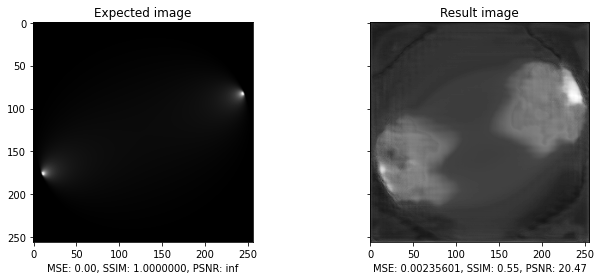

In [ ]:
metrics35000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_35000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics35000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_35000.xlsx')

**Model8_100e_4b_256_36000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
249--------Metricas tradicionales----------
Mean MSE: 0.003259210131170262
Std. Dev MSE: 0.0035438916217374623
Mean SSIM: 0.4553435438013298
Std. Dev SSIM: 0.13164751878736203
Mean PSNR: 19.285627470225467
Std. Dev PSNR: 3.491515466169702
--------Metricas No Reference----------
Mean Brisque: 51.39594580078125
Std. Dev Brisque: 16.266222048019337
Mean DBCNN: 27.807134117126466
Std. Dev DBCNN: 3.8131355011512738
Mean nima: 5.227638240814209
Std. Dev nima: 0.39740610899062756
Mean nrqm: 2.1388652749061583
Std. Dev nrqm: 0.24248419284335573
--------Metricas Full Reference----------
Mean ckdn: 0.4456181424856186
Std. Dev ckdn: 0.0523835698745344
Mean dists: 0.40602366161346437
Std. Dev dists: 0.05935315470676146
Mean lpips: 0.26382313069701196
Std. Dev lpips: 0.09872252150819867


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


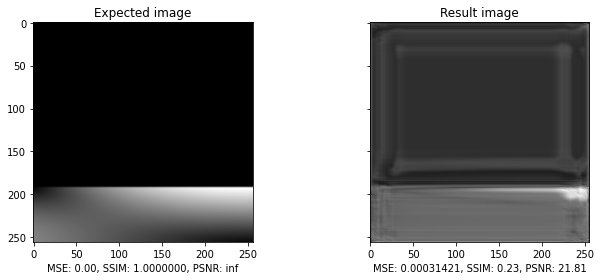

In [ ]:
metrics36000 = metrics(get_photoelasnet(), 'PhotoelasNet4_100e_4b_256_36000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics36000).T
df.columns = cs
df.to_excel('MetricasPhotoelasNet8_36000.xlsx')

**Predicción sobre imágenes externas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

def predict(arq, model_url, bs, image):
  model = read_model(arq, model_url, bs)
  image = np.expand_dims(np.load('/content/drive/My Drive/Tesis/SeleccionJhonatan2/Disco/Stack1234/'+ str(image) + '.npy'), axis=0)
  image = image/255
  pred = model.predict(image, batch_size=bs)
  pred = np.reshape(pred, (256, 256))

  #Show result
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Predicted image
  ax[0].imshow(np.reshape(image,(256,256,4)), cmap='gray')
  ax[0].set_title('Original image')

  #Original image
  ax[1].imshow(pred, cmap='gray')
  ax[1].set_title('Predicted image')

  plt.tight_layout()
  plt.show()

# **Anillo**

**Modelo 2**

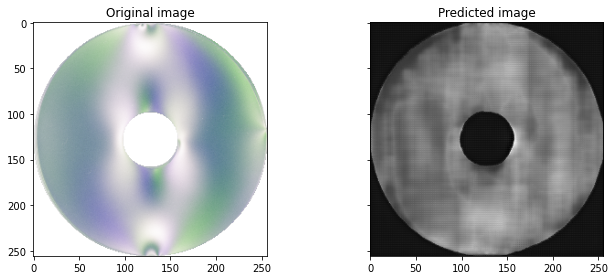

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

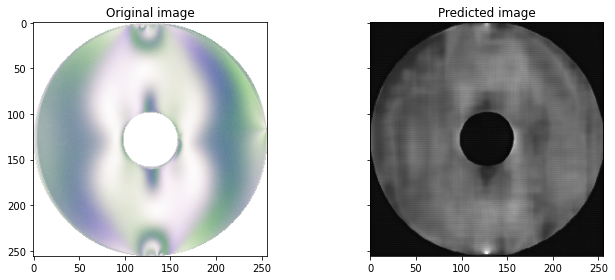

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

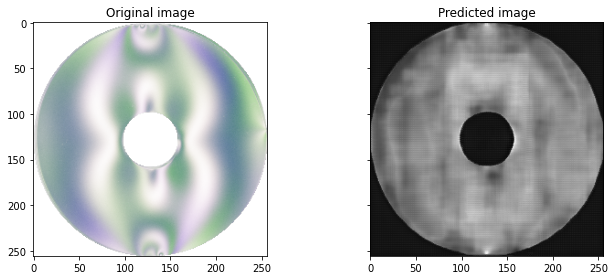

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

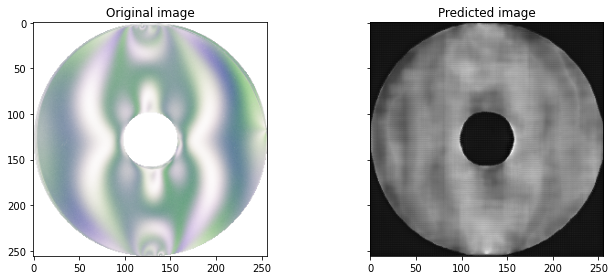

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

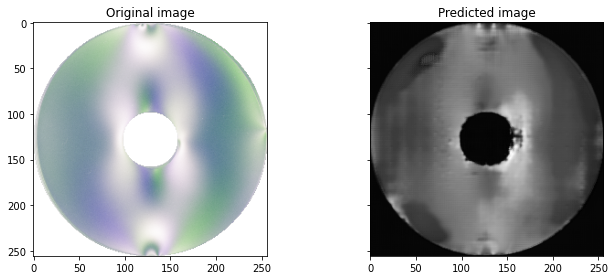

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

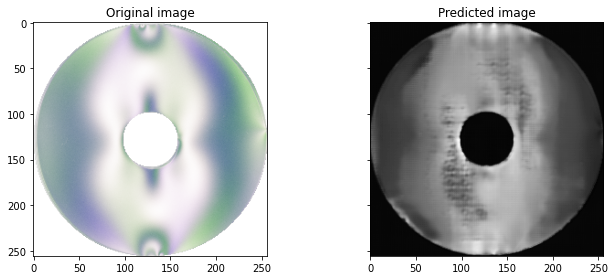

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

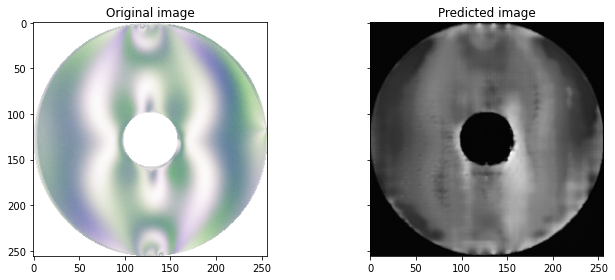

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

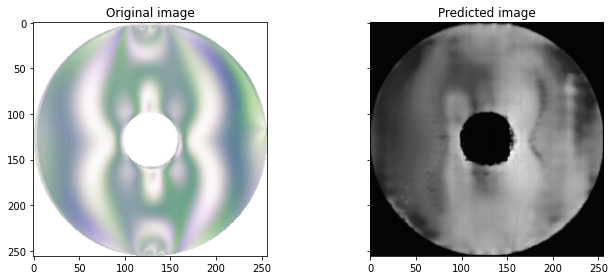

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)

---

# **Disco**

**Modelo 2**

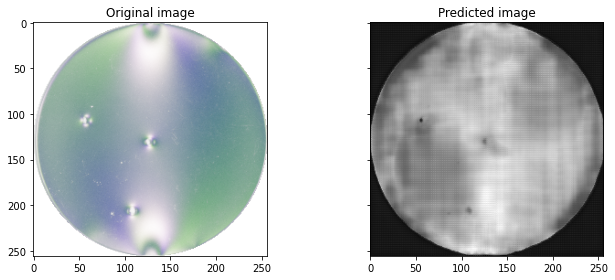

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

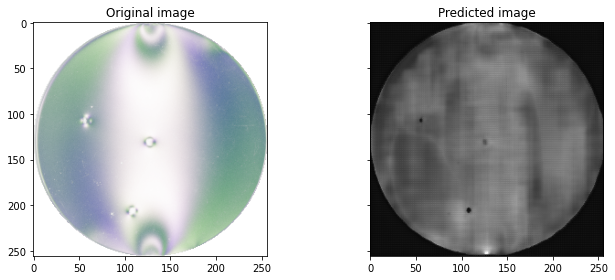

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

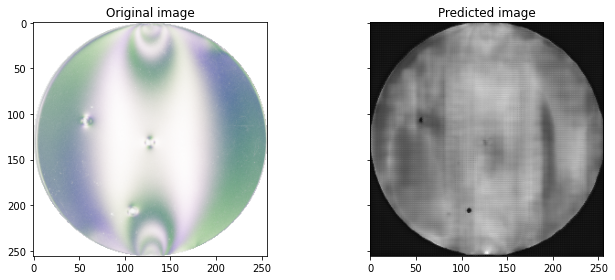

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

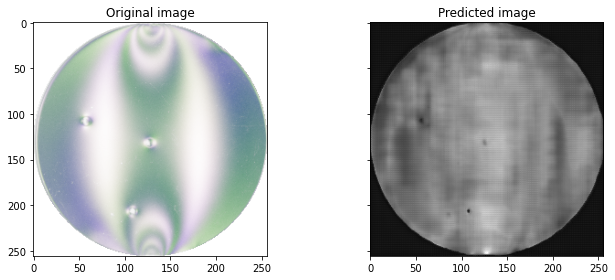

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

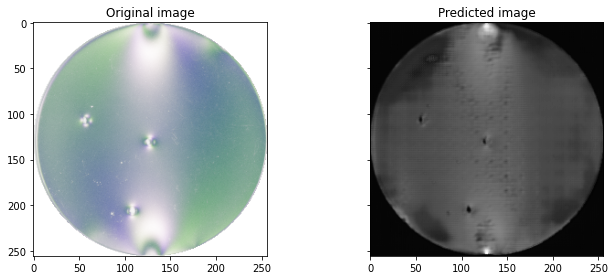

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

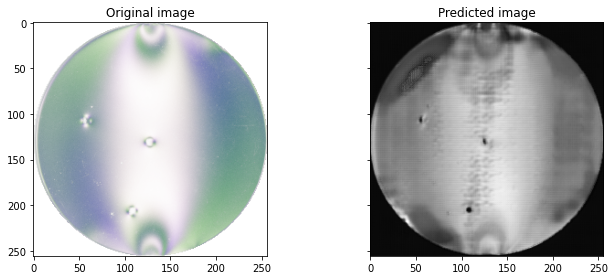

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

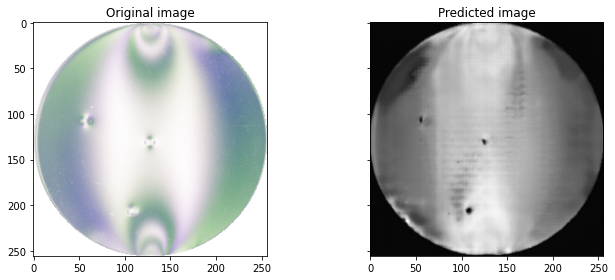

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

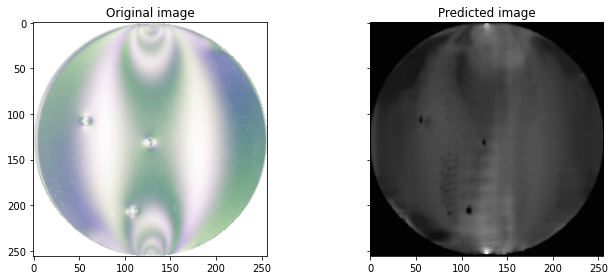

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)